# Loan prediction

### Before Starting:
Company Information:
Lending Club is a peer to peer lending company based in the United States, in which investors provide funds for potential borrowers and investors earn a profit depending on the risk they take (the borrowers credit score). Lending Club provides the "bridge" between investors and borrowers. For more basic information about the company please check out the wikipedia article about the company.

### Problem definition
Numerous companies from financial indutry often invest considerable resources to improve their predictive models with the aim of having better insights into their customers. Such an interest in model improvement has intensified in recent years mostly because of fast development of machine learning and artificial intelligence. For standard lending institution default predictive model with high performance helps to considerably minimize Credit Loss, resulting in higher revenue and profits. Usually the better predictive model the more efficient is the underwriting policy and collection process. A well-functioning model should distinguish creditworthy customers from those that are credit risks. Often, more-predictive credit-decisioning model can identify a greater number of customers within an institution’s specified risk tolerance, which should expand revenues as well.

In given task the goal is to increase detection of defaulted loans before the loan is issued/offered by P2P lending company - Lending Club. Peer-to-peer lending differs from traditional financial institutions like banks or commercial lending companies. Below I'll try to analyze possible business gains from better detection of defaults for Lending Club.

### Refering to Wikipedia:

LendingClub made money by charging borrowers an origination fee and investors a service fee. The size of the origination fee depended on the credit grade and ranges to be 1.1–5.0% of the loan amount. The size of the service fee was 1% on all amounts the borrower pays.

So, Lending Club is a mediator between investors and borrowers, earning money by charging both. The main Lending Club interest is to attract more clients and maintain protfolio size. The motivation of borrowers is clear, they want to find as cheap capital as possible, so they're seeking for the best offer at the market, which is available for them. In case of investors the motivation is obvious as well. Investors look for high ROI (return of investments), but remembering that returns are proportional to risks, we may formalize saying, that investors look for appropriate returns/risks ratio. If investors experience losses it may cause churn rate growth.

The underwriting process for Lending Club looks like this. Borrower applies for the loan, then if he/she meets all the basic requirements - Lending Club using their scoring model assigns client to respective grade. There are 7 grades and 35 sub-grades. Interest rate is dependent on sub-grade. Please see more info here. After that, Lending Club gives access to the loan for investors with information about the loan and the borrower (incl. grade and sub-grade) and investors decide whether or not to invest money in this loan. The lower the grade the higher the interest rate, which means, that investors may take higher risks to gain potentially higher returns.

Seeking for default rate reduction we can end up with too restrictive underwriting policy which does not neccessary correlate with higher ROI for investors, because we'll not let investors choose risky loans, which means lower interests. For Lending Club it probably means the loss of investors with high risk appetite and borrowers with weak credit history, or in case of Lending Club those who need higher loan amount.

The main goal of this notebook is to show, that there is a space for improvement for Lending Clubs's grading policy. Grading is a base for interest rate assignment, so adequate risk evaluation should help investors to make more perceived investment decisions which is in line with ther risk appetite. Besides, probably it will result lower churn rate for platform's client.

<img src="http://echeck.org/wp-content/uploads/2016/12/Showing-how-the-lending-club-works-and-makes-money-1.png"><br><br>

### What did we do?

We develop a number of data-driven investment strategies that demonstrate how machine learning and data analytics can be used to guide investments in peer-to-peer loans. We detail the process starting with the acquisition of
(real) data from a peer-to-peer lending platform all the way to the development and evaluation of investment strategies based on a variety of approaches. We focus heavily on how to apply and evaluate the data science methods,
and resulting strategies, in a real-world business setting. The material presented in this article can be used by instructors who teach data science courses, at the undergraduate or graduate levels. Importantly, we go beyond just evaluating predictive performance of models, to assess how well the strategies would actually perform, using real,
publicly available data. Our treatment is comprehensive and ranges from qualitative to technical, but is also modular—which gives instructors the flexibility to focus on specific parts of the case, depending on the topics they want
to cover. The learning concepts include the following: data cleaning and ingestion, classification/probability estimation modeling, regression modeling, analytical engineering, calibration curves, data leakage, evaluation of model
performance, basic portfolio optimization, evaluation of investment strategies, and using Python for data science.

source:https://github.com/mijiubon/data/blob/master/Lending%20Club%20(2).pdf

### Content

The Notebook will include:

1. Cleaning, Preprocessing and EDA
    * Data import, celaning and Preprocessiong
    * Data Visualization
    * Normalize Data with SKLearn
    * Implementing MICE to Fill missing data
2. Feature Analysis and Selection
    * Implement LassoCV For Feature Selection
    * Implementimg FeatureTools
    * Shap
3. Models
    * Linear Regression, Implementing Lasso (L1), Ridge (L2) and Elastic Net Regularization
    * Random Forest
    * Neural Network
    * AutoSKLearn
    * H2o AI(Random Forest/Linear Regression/Neural Network)
    * Tpot
4. Testing

In [8]:
!conda install numpy scipy scikit-learn pandas joblib pytorch --y
!pip install deap update_checker tqdm s
!pip install dask[delayed] dask[dataframe] dask-ml fsspec>=0.3.3 distributed>=2.10.0
!pip install scikit-mdr skrebate
!pip install tpot
!pip install auto-sklearn

     |████████████████████████████████| 86 kB 490 kB/s eta 0:00:011


## 1. Cleaning, Preprocessing and EDA

### -Data import, celaning and Preprocessiong
### -Data Visualization

| Column Name | Description  | Type| Formula| Contains Nulls| Want? 
| ---------- |---------- | ---- |------- |-------------- |-------
id|	Unique ID for the loan listing|	Numeric| n|	n|	y
member_id|	Unique ID for the borrower member|	Numeric	|n |	n|	y|
loan_amnt|	The total amount, a borrower is authorized to borrow|	Numeric|n |	n|	y
funded_amnt|	 Total amount committed to a loan |Numeric	| n |	n	|y
funded_amnt_inv|	Total amount committed by investors for that loan|	Numeric|n	|n |	y
term|	Number of Payments on the Loan, Usually value in Months	|Numeric |n	|n	|y
int_rate|	Interest rate on the loan	|Numeric |	n	|n	|y
installment|	Monthly payment amount	|Numeric	|n	|n	|y
grade|	Lending Club assigned loan grade	|Categorical 	|n	|n	|y
sub_grade|	Lending Club assigned loan sub grade	|Categorical |	n	|n	|y
emp_title|	Job title of the Borrower|	Categorical |	n	|y	|n
emp_length|	Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years.| 	Numeric|	n|	n|	y
home_ownership|	The home ownership status provided by the borrower during registration. Our values are: RENT, OWN, MORTGAGE, OTHER.	|Categorical |	n	|n	|y
annual_inc|	The self-reported annual income provided by the borrower during registration.	|Numeric	|n|	y|	y
verification_status|	Indicates if the co-borrowers' joint income was verified by LC, not verified, or if the income source was verified|	Categorical| 	n|	n|	y
issue_d|	The month which the loan was funded|	Categorical|	n|	n|	y
loan_status|	Current status of the loan|	Categorical |	n|	n|	y
pymnt_plan|	Indicates if a payment plan has been put in place for the loan|	Categorical| 	n|	n	|y
url|	URL for the LC page with listing data.	|Categorical |	n	|y	|n
desc	|Loan description provided by the borrower	|Categorical 	|n	|y	|n
purpose	|A category provided by the borrower for the loan request. 	|Categorical |	n	|n|	n
title	|The loan title provided by the borrower|	Categorical |	n	|n|	n
zip_code	|The first 3 numbers of the zip code provided by the borrower in the loan application.|	Numeric|	n	|n	|y
addr_state	|The state provided by the borrower in the loan application	|Categorical |	n|	n	|y
dti|	A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.|	Numeric|	(Total Debts)/(Total Income)	|n|	y
delinq_2yrs|	The number of 30+ days past-due incidences of delinquency in the borrower's credit file for the past 2 years|	Numeric|	n	|y |	y
earliest_cr_line	|The month the borrower's earliest reported credit line was opened	 | Categorical|	n	|y	|y
inq_last_6mths	|The number of inquiries in past 6 months (excluding auto and mortgage inquiries)|	Numeric|	n|	y	|y
mths_since_last_delinq	|The number of months since the borrower's last delinquency.	|Numeric |	n	|y |	y
mths_since_last_record	|The number of months since the last public record.	|Numeric	|n	|y|	y
open_acc	|The number of open credit lines in the borrower's credit file.	|Numeric	|n	|y	|y
pub_rec|	Number of derogatory public records	|Numeric	|n	|y	|y
revol_bal|	Total credit revolving balance	|Numeric|	n	|n	|y
revol_util	|Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.|	Numeric|	n|	y	|y
total_acc	|The total number of credit lines currently in the borrower's credit file|	Numeric|	n	|y|	y
initial_list_status	|The initial listing status of the loan. Possible values are – W, F	|Categorical |	n	|n|	y
out_prncp	|Remaining outstanding principal for total amount funded 	|Numeric	|loan_amnt - total_rec_prncp	|n |	y
out_prncp_inv|	Remaining outstanding principal for portion of total amount funded by investors|	Numeric	|loan_amnt - total_rec_prncp|	n|	y
total_pymnt	|Payments received to date for total amount funded	|Numeric	|total_rec_prncp + total_rec_int|	n	|y
total_pymnt_inv	|Payments received to date for portion of total amount funded by investors	|Numeric	|total_rec_prncp + total_rec_int	|n |	y
total_rec_prncp|	Principal received to date	|Numeric |	months*part of installment	|n	|y
total_rec_int|	Interest received to date|	Numeric	|months*part of installment|	n	|y
total_rec_late_fee|	Late fees received to date|	Numeric|	n	|n	|y
recoveries	|post charge off gross recovery|	Numeric	|if the loan  is charged off then what recoveries we get|	n	|y
collection_recovery_fee|	post charge off collection fee|	Numeric	|service charge to collect data|	n	|y
last_pymnt_d|	Last month payment was received	|Categorical|	n	|y |	y
last_pymnt_amnt	|Last total payment amount received	|Numeric	|direct	|n	|y
next_pymnt_d	|Next scheduled payment date|	Categorical	|n	|y |	y
last_credit_pull_d	|The most recent month LC pulled credit for this loan|	Categorical	|n	|y|	y
collections_12_mths_ex_med	|Number of collections in 12 months excluding medical collections|	Numeric|	n|	y	|y
mths_since_last_major_derog	|Months since most recent 90-day or worse rating	|Numeric	|n |	y	|y
policy_code	|publicly available policy_code=1	|Numeric	|n	|n	|y
application_type|	Indicates whether the loan is an individual application or a joint application with two co-borrowers|	Categorical|	n	|n	|y
annual_inc_joint|	The combined self-reported annual income provided by the co-borrowers during registration	|Numeric	|n	|y	|y
dti_joint	|A ratio calculated using the co-borrowers' total monthly payments on the total debt obligations, excluding mortgages and the requested LC loan, divided by the co-borrowers' combined self-reported monthly income|	Numeric	|n	|y	|y
verification_status_joint	|Indicates if the co-borrowers' joint income was verified by LC, not verified, or if the income source was verified	|Categorical	|n	|y	|y
acc_now_delinq	|The number of accounts on which the borrower is now delinquent.	|Numeric|	n	|n	|y
tot_coll_amt	|Total collection amounts ever owed	|Numeric	|n	|y	|y
tot_cur_bal	|Total current balance of all accounts	|Numeric	|n	|y	|y
open_acc_6m	|Number of open trades in last 6 months	|Numeric	|n	|y	|y
open_il_6m	|Number of currently active installment trades	|Numeric	|n	|y |	y
open_il_12m	|Number of installment accounts opened in past 12 months	|Numeric	|n	|y	|y
open_il_24m	|Number of installment accounts opened in past 24 months	|Numeric	|n	|y	|y
mths_since_rcnt_il	|Months since most recent installment accounts opened	|Numeric	|n	|y|	y
total_bal_il|	Total current balance of all installment accounts	|Numeric	|n	|y	|y
il_util	|Ratio of total current balance to high credit/credit limit on all install acct	| Numeric|	n	|y	|y
open_rv_12m	|Number of revolving trades opened in past 12 months	|Numeric	|n	|y	|y
open_rv_24m|	Number of revolving trades opened in past 24 months	Numeric	|n	|y	|y
max_bal_bc	|Maximum current balance owed on all revolving accounts	|Numeric	|n	|y	|y
all_util	|Balance to credit limit on all trades	|Numeric	|n	|y	|y
total_rev_hi_lim|	Total revolving high credit/credit limit	|Numeric	|n	|y	|y
inq_fi	|Number of personal finance inquiries	|Numeric	|n	|y	|y
total_cu_tl|	Number of Finance Trades	|Numeric	|n	|y	|y
inq_last_12m	|Number of credit inquiries in past 12 months	|Numeric	|n	|y	|y

The data set includes hundreds of features, including
the following, for each loan:
1. Interest rate
2. Loan amount
3. Monthly installment amount
4. Loan status (e.g., fully paid, default, charged-off)
5. Several additional attributes related to the borrower such as type of house ownership, annual income, monthly FICO score, debt-to-income ratio, and number of open credit lines.

Most Categorical Variables are Text (Descriptions) whereas the others are Date (Days of Week, Months).
Some Numeric Variables are derived based on the values of Other Numeric Variables.

In [76]:
df=pd.read_csv("loan.csv",header=0,encoding='utf-8')

Columns (19,55) have mixed types.Specify dtype option on import or set low_memory=False.


In [103]:
import pandas as pd
import numpy as np

In [220]:
dataset = pd.read_csv("loan.csv",header=0,encoding='utf-8')

In [221]:
# Creating a Copy of the Dataset to ignore affecting original data
df = dataset.copy()

In [222]:
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
0,1077501,1296599,5000.0,5000.0,4975.0,36 months,10.65,162.87,B,B2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1077430,1314167,2500.0,2500.0,2500.0,60 months,15.27,59.83,C,C4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1077175,1313524,2400.0,2400.0,2400.0,36 months,15.96,84.33,C,C5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1076863,1277178,10000.0,10000.0,10000.0,36 months,13.49,339.31,C,C1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1075358,1311748,3000.0,3000.0,3000.0,60 months,12.69,67.79,B,B5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [311]:
import seaborn as sns
from matplotlib import rcParams
import cufflinks as cf

import plotly.offline as py 
import plotly.figure_factory as ff 
import plotly.graph_objs as go 

from plotly import tools 


#To plot figs on jupyter
%matplotlib inline
# figure size in inches
rcParams['figure.figsize'] = 16,8

In [313]:
df_loan = pd.read_csv("loan.csv",header=0,encoding='utf-8')
df_loan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 887379 entries, 0 to 887378
Data columns (total 74 columns):
id                             887379 non-null int64
member_id                      887379 non-null int64
loan_amnt                      887379 non-null float64
funded_amnt                    887379 non-null float64
funded_amnt_inv                887379 non-null float64
term                           887379 non-null object
int_rate                       887379 non-null float64
installment                    887379 non-null float64
grade                          887379 non-null object
sub_grade                      887379 non-null object
emp_title                      835917 non-null object
emp_length                     842554 non-null object
home_ownership                 887379 non-null object
annual_inc                     887375 non-null float64
verification_status            887379 non-null object
issue_d                        887379 non-null object
loan_status          

In [314]:
# Column Names

print(df_loan.columns)

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose',
       'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'mths_since_last_delinq',
       'mths_since_last_record', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'initial_list_status', 'out_prncp',
       'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp',
       'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'next_pymnt_d', 'last_credit_pull_d', 'collections_12_mths_ex_med',
       'mths_since_last_major_derog', 'policy_code', 'application_type',
       'annual_inc_joint', 'dti_joint', 'verification_status_joint',
    

#### The loan amount distribution

<Figure size 864x432 with 0 Axes>

Text(0.5, 0, '')

Text(0, 0.5, 'Frequency Dist')

Text(0.5, 1.0, 'Frequency Distribuition')

Text(0.5, 0, '')

Text(0, 0.5, 'Amount Dist')

Text(0.5, 1.0, 'Amount Distribuition')

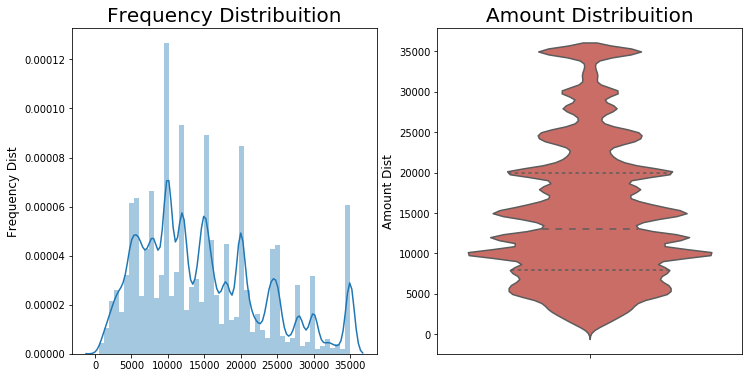

In [316]:
plt.figure(figsize=(12,6))

plt.subplot(121)
g = sns.distplot(df_loan["loan_amnt"])
g.set_xlabel("", fontsize=12)
g.set_ylabel("Frequency Dist", fontsize=12)
g.set_title("Frequency Distribuition", fontsize=20)

plt.subplot(122)
g1 = sns.violinplot(y="loan_amnt", data=df_loan, 
               inner="quartile", palette="hls")
g1.set_xlabel("", fontsize=12)
g1.set_ylabel("Amount Dist", fontsize=12)
g1.set_title("Amount Distribuition", fontsize=20)

plt.show()

<Figure size 720x576 with 0 Axes>

Text(0.5, 0, '')

Text(0, 0.5, 'Distribuition')

Text(0.5, 1.0, 'Int Rate Log distribuition')

Text(0.5, 0, 'Int Rate')

Text(0, 0.5, 'Count')

Text(0.5, 1.0, 'Int Rate Normal Distribuition')

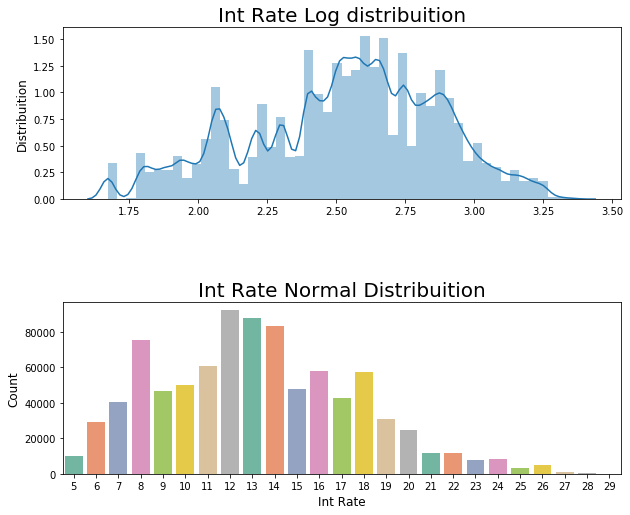

In [317]:

df_loan['int_round'] = df_loan['int_rate'].round(0).astype(int)

plt.figure(figsize = (10,8))

#Exploring the Int_rate
plt.subplot(211)
g = sns.distplot(np.log(df_loan["int_rate"]))
g.set_xlabel("", fontsize=12)
g.set_ylabel("Distribuition", fontsize=12)
g.set_title("Int Rate Log distribuition", fontsize=20)

plt.subplot(212)
g1 = sns.countplot(x="int_round",data=df_loan, 
                   palette="Set2")
g1.set_xlabel("Int Rate", fontsize=12)
g1.set_ylabel("Count", fontsize=12)
g1.set_title("Int Rate Normal Distribuition", fontsize=20)

plt.subplots_adjust(wspace = 0.2, hspace = 0.6,top = 0.9)

plt.show()

In [318]:
df_loan.loc[df_loan.loan_status == \
            'Does not meet the credit policy. Status:Fully Paid', 'loan_status'] = 'NMCP Fully Paid'
df_loan.loc[df_loan.loan_status == \
            'Does not meet the credit policy. Status:Charged Off', 'loan_status'] = 'NMCP Charged Off'

#### The loan status

Current               601779
Fully Paid            207723
Charged Off            45248
Late (31-120 days)     11591
Issued                  8460
In Grace Period         6253
Late (16-30 days)       2357
NMCP Fully Paid         1988
Default                 1219
NMCP Charged Off         761
Name: loan_status, dtype: int64


<Figure size 864x1008 with 0 Axes>

[Text(0, 0, 'Fully Paid'),
 Text(0, 0, 'Charged Off'),
 Text(0, 0, 'Current'),
 Text(0, 0, 'Default'),
 Text(0, 0, 'Late (31-120 days)'),
 Text(0, 0, 'In Grace Period'),
 Text(0, 0, 'Late (16-30 days)'),
 Text(0, 0, 'NMCP Fully Paid'),
 Text(0, 0, 'NMCP Charged Off'),
 Text(0, 0, 'Issued')]

Text(0.5, 0, '')

Text(0, 0.5, 'Count')

Text(0.5, 1.0, 'Loan Status Count')

[Text(0, 0, 'Fully Paid'),
 Text(0, 0, 'Charged Off'),
 Text(0, 0, 'Current'),
 Text(0, 0, 'Default'),
 Text(0, 0, 'Late (31-120 days)'),
 Text(0, 0, 'In Grace Period'),
 Text(0, 0, 'Late (16-30 days)'),
 Text(0, 0, 'NMCP Fully Paid'),
 Text(0, 0, 'NMCP Charged Off'),
 Text(0, 0, 'Issued')]

Text(0.5, 0, '')

Text(0, 0.5, 'Total Acc')

Text(0.5, 1.0, 'Duration Count')

[Text(0, 0, 'Fully Paid'),
 Text(0, 0, 'Charged Off'),
 Text(0, 0, 'Current'),
 Text(0, 0, 'Default'),
 Text(0, 0, 'Late (31-120 days)'),
 Text(0, 0, 'In Grace Period'),
 Text(0, 0, 'Late (16-30 days)'),
 Text(0, 0, 'NMCP Fully Paid'),
 Text(0, 0, 'NMCP Charged Off'),
 Text(0, 0, 'Issued')]

Text(0.5, 0, 'Duration Distribuition')

Text(0, 0.5, 'Count')

Text(0.5, 1.0, 'Loan Amount')

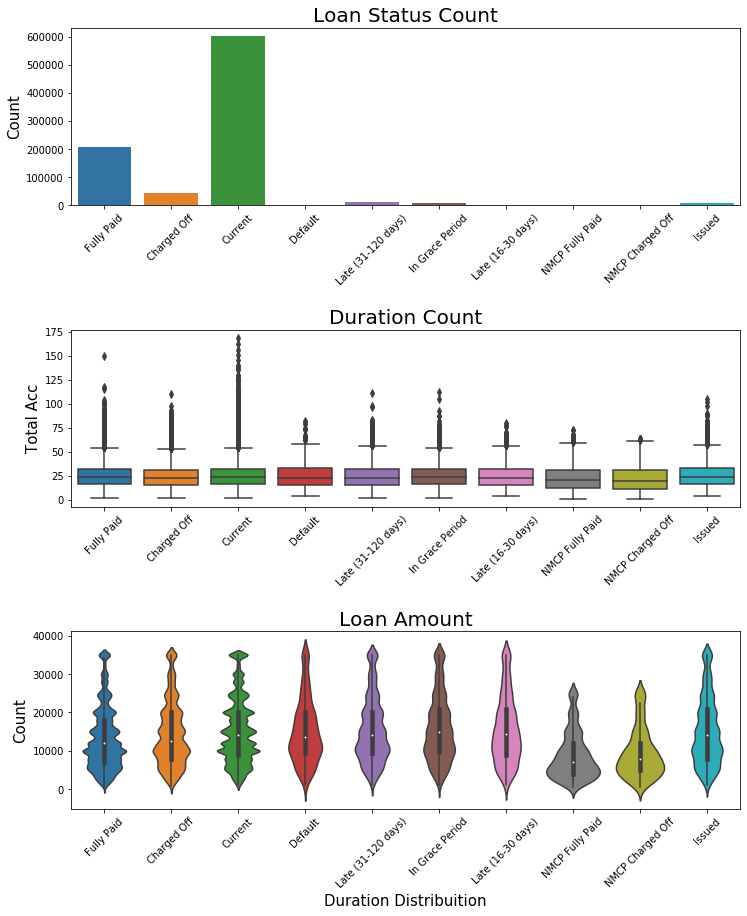

In [319]:
print(df_loan.loan_status.value_counts())

plt.figure(figsize = (12,14))

plt.subplot(311)
g = sns.countplot(x="loan_status", data=df_loan)
g.set_xticklabels(g.get_xticklabels(),rotation=45)
g.set_xlabel("", fontsize=12)
g.set_ylabel("Count", fontsize=15)
g.set_title("Loan Status Count", fontsize=20)

plt.subplot(312)
g1 = sns.boxplot(x="loan_status", y="total_acc", data=df_loan)
g1.set_xticklabels(g1.get_xticklabels(),rotation=45)
g1.set_xlabel("", fontsize=12)
g1.set_ylabel("Total Acc", fontsize=15)
g1.set_title("Duration Count", fontsize=20)

plt.subplot(313)
g2 = sns.violinplot(x="loan_status", y="loan_amnt", data=df_loan)
g2.set_xticklabels(g2.get_xticklabels(),rotation=45)
g2.set_xlabel("Duration Distribuition", fontsize=15)
g2.set_ylabel("Count", fontsize=15)
g2.set_title("Loan Amount", fontsize=20)

plt.subplots_adjust(wspace = 0.2, hspace = 0.7,top = 0.9)

plt.show()


#### Loan status by month/year

In [320]:
df_loan['issue_month'], df_loan['issue_year'] = df_loan['issue_d'].str.split('-', 1).str

<Figure size 1008x432 with 0 Axes>

[Text(0, 0, 'Jan'),
 Text(0, 0, 'Feb'),
 Text(0, 0, 'Mar'),
 Text(0, 0, 'Apr'),
 Text(0, 0, 'May'),
 Text(0, 0, 'Jun'),
 Text(0, 0, 'Jul'),
 Text(0, 0, 'Aug'),
 Text(0, 0, 'Sep'),
 Text(0, 0, 'Oct'),
 Text(0, 0, 'Nov'),
 Text(0, 0, 'Dec')]

Text(0.5, 0, 'Duration Distribuition')

Text(0, 0.5, 'Mean amount')

Text(0.5, 1.0, 'Loan Amount by Months')

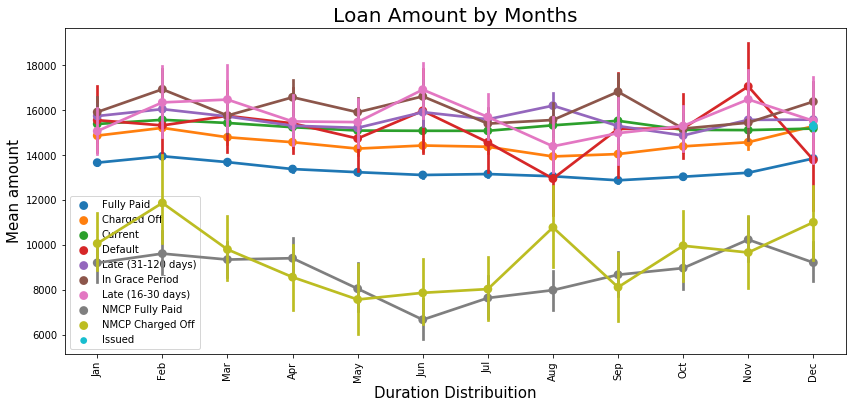

In [321]:

months_order = ["Jan", "Feb", "Mar", "Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"]
df_loan['issue_month'] = pd.Categorical(df_loan['issue_month'],categories=months_order, ordered=True)

#Issue_d x loan_amount
plt.figure(figsize = (14,6))

g = sns.pointplot(x='issue_month', y='loan_amnt', 
                  data=df_loan, 
                  hue='loan_status')
g.set_xticklabels(g.get_xticklabels(),rotation=90)
g.set_xlabel("Duration Distribuition", fontsize=15)
g.set_ylabel("Mean amount", fontsize=15)
g.legend(loc='best')
g.set_title("Loan Amount by Months", fontsize=20)
plt.show()

<Figure size 1008x432 with 0 Axes>

[Text(0, 0, '2007'),
 Text(0, 0, '2008'),
 Text(0, 0, '2009'),
 Text(0, 0, '2010'),
 Text(0, 0, '2011'),
 Text(0, 0, '2012'),
 Text(0, 0, '2013'),
 Text(0, 0, '2014'),
 Text(0, 0, '2015')]

Text(0.5, 0, 'Dates')

Text(0, 0.5, 'Count')

Text(0.5, 1.0, 'Analysing Loan Status by Years')

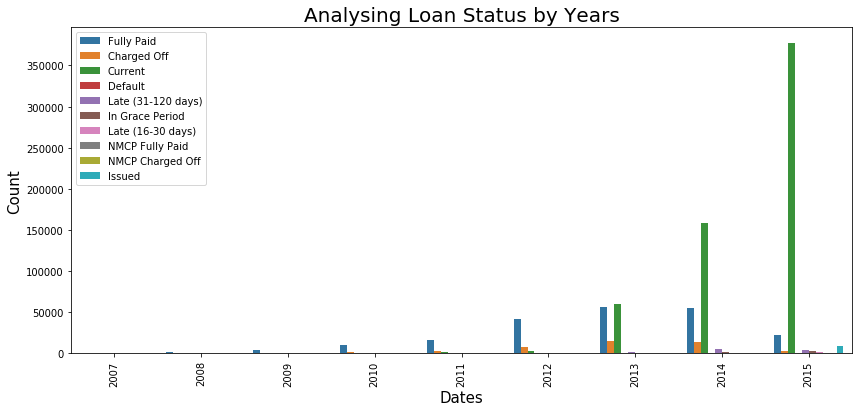

In [322]:
plt.figure(figsize = (14,6))
#Looking the count of defaults though the issue_d that is The month which the loan was funded
g = sns.countplot(x='issue_year', data=df_loan,
                  hue='loan_status')
g.set_xticklabels(g.get_xticklabels(),rotation=90)
g.set_xlabel("Dates", fontsize=15)
g.set_ylabel("Count", fontsize=15)
g.legend(loc='upper left')
g.set_title("Analysing Loan Status by Years", fontsize=20)
plt.show()

<Figure size 1008x432 with 0 Axes>

[Text(0, 0, '2010'),
 Text(0, 0, '2011'),
 Text(0, 0, '2012'),
 Text(0, 0, '2013'),
 Text(0, 0, '2014'),
 Text(0, 0, '2015')]

Text(0.5, 0, 'Dates')

Text(0, 0.5, 'Count')

No handles with labels found to put in legend.


Text(0.5, 1.0, 'Analysing Defaults Count by Time')

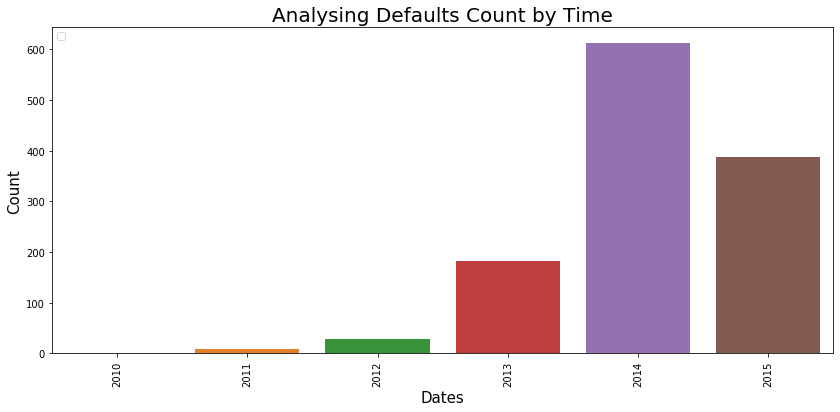

In [323]:
plt.figure(figsize = (14,6))
#Looking the count of defaults though the issue_d that is The month which the loan was funded
g = sns.countplot(x='issue_year', data=df_loan[df_loan['loan_status'] =='Default'])
g.set_xticklabels(g.get_xticklabels(),rotation=90)
g.set_xlabel("Dates", fontsize=15)
g.set_ylabel("Count", fontsize=15)
g.legend(loc='upper left')
g.set_title("Analysing Defaults Count by Time", fontsize=20)
plt.show()

#### Loan status and purpose

In [325]:
#Exploring the loan_status x purpose
purp_loan= ['purpose', 'loan_status']
cm = sns.light_palette("green", as_cmap=True)
pd.crosstab(df_loan[purp_loan[0]], df_loan[purp_loan[1]]).style.background_gradient(cmap = cm)

loan_status,Charged Off,Current,Default,Fully Paid,In Grace Period,Issued,Late (16-30 days),Late (31-120 days),NMCP Charged Off,NMCP Fully Paid
purpose,,,,,,,,,,
car,448,4937,10,3198,40,81,15,70,13,51
credit_card,7826,149835,233,42250,1150,2071,381,2096,69,271
debt_consolidation,27599,356239,790,120764,3998,4796,1510,7419,292,808
educational,56,1,0,269,0,0,0,0,32,65
home_improvement,2269,34980,47,12660,367,493,137,662,71,143
house,286,1854,7,1366,37,37,15,61,11,33
major_purchase,874,10308,14,5391,125,184,51,207,23,100
medical,569,5324,15,2285,56,91,17,125,22,36
moving,425,3121,11,1603,43,52,23,90,15,31


#### Loan status and grade

In [329]:
loan_grade = ['loan_status', 'grade']
cm = sns.light_palette("lightblue", as_cmap=True)
pd.crosstab(df_loan[loan_grade[0]], df_loan[loan_grade[1]]).style.background_gradient(cmap = cm)

grade,A,B,C,D,E,F,G
loan_status,,,,,,,
Charged Off,2617,9519,12642,10486,6258,2934,792
Current,103322,171735,171175,91984,47061,13589,2913
Default,47,198,360,312,201,79,22
Fully Paid,39679,66546,52678,30020,12928,4726,1146
In Grace Period,365,1240,1887,1405,908,354,94
Issued,1448,2529,2472,1185,593,194,39
Late (16-30 days),134,410,678,569,368,155,43
Late (31-120 days),492,2004,3339,2890,1852,768,246
NMCP Charged Off,8,85,148,197,158,93,72


#### Loan status and home owner type

In [332]:
loan_home = ['loan_status', 'home_ownership']
cm = sns.light_palette("pink", as_cmap=True)
pd.crosstab(df_loan[loan_home[0]], df_loan[loan_home[1]]).style.background_gradient(cmap = cm)

home_ownership,ANY,MORTGAGE,NONE,OTHER,OWN,RENT
loan_status,,,,,,
Charged Off,0,19878,7,27,4025,21311
Current,2,303764,2,3,62041,235967
Default,0,498,0,0,110,611
Fully Paid,1,104966,36,114,17960,84646
In Grace Period,0,2855,0,0,637,2761
Issued,0,4220,0,0,1038,3202
Late (16-30 days),0,1101,0,0,260,996
Late (31-120 days),0,5019,0,0,1212,5360
NMCP Charged Off,0,348,1,11,49,352


#### Loan status and verification status

In [333]:
#Looking the 'verification_status' column that is the Indicates 
#if the co-borrowers' joint income was verified by LC, not verified, or if the income source was verified
loan_verification = ['loan_status', 'verification_status']
cm = sns.light_palette("orange", as_cmap=True)
pd.crosstab(df_loan[loan_verification[0]], df_loan[loan_verification[1]]).style.background_gradient(cmap = cm)

verification_status,Not Verified,Source Verified,Verified
loan_status,,,
Charged Off,12208,13740,19300
Current,171400,243705,186674
Default,278,462,479
Fully Paid,73856,60271,73596
In Grace Period,1403,2523,2327
Issued,2779,2836,2845
Late (16-30 days),473,1006,878
Late (31-120 days),2521,4725,4345
NMCP Charged Off,511,82,168


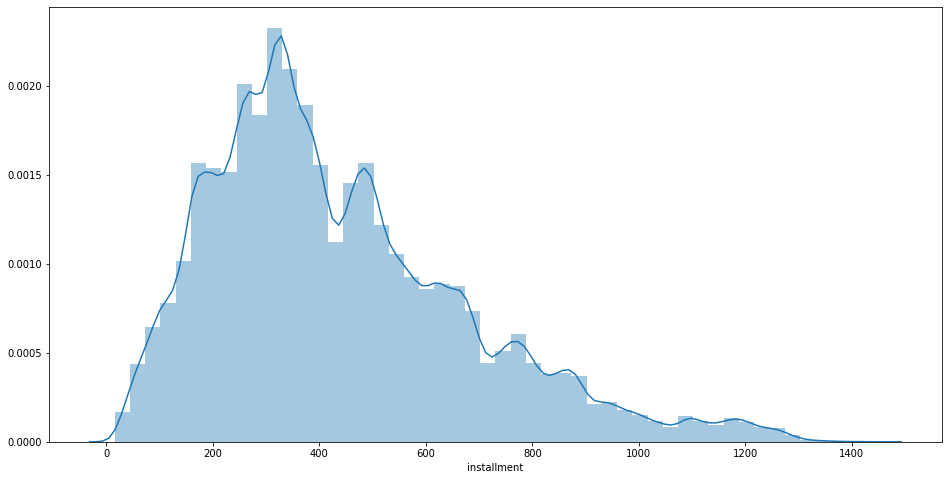

In [334]:
sns.distplot(df_loan['installment'])
plt.show()

#### Loan distribution and home owner type

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Home Ownership - Loan Distribuition')

Text(0.5, 0, '')

Text(0, 0.5, 'Loan Amount')

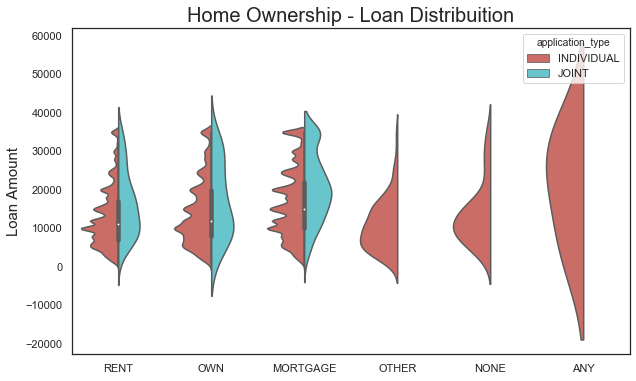

In [469]:
plt.figure(figsize = (10,6))

g = sns.violinplot(x="home_ownership",y="loan_amnt",data=df_loan,
               kind="violin",
               split=True,palette="hls",
               hue="application_type")
g.set_title("Home Ownership - Loan Distribuition", fontsize=20)
g.set_xlabel("", fontsize=15)
g.set_ylabel("Loan Amount", fontsize=15)

plt.show()

#### Loan amount, application purpose and application type(individual/joint)

Purposes count description: 
application_type    INDIVIDUAL  JOINT
purpose                              
car                       8862      1
credit_card             206067    115
debt_consolidation      523881    334
educational                423      0
home_improvement         51803     26
house                     3707      0
major_purchase           17275      2
medical                   8538      2
moving                    5413      1
other                    42867     27
renewable_energy           575      0
small_business           10375      2
vacation                  4735      1
wedding                   2347      0


<Figure size 864x576 with 0 Axes>

[Text(0, 0, 'credit_card'),
 Text(0, 0, 'car'),
 Text(0, 0, 'small_business'),
 Text(0, 0, 'other'),
 Text(0, 0, 'wedding'),
 Text(0, 0, 'debt_consolidation'),
 Text(0, 0, 'home_improvement'),
 Text(0, 0, 'major_purchase'),
 Text(0, 0, 'medical'),
 Text(0, 0, 'moving'),
 Text(0, 0, 'vacation'),
 Text(0, 0, 'house'),
 Text(0, 0, 'renewable_energy'),
 Text(0, 0, 'educational')]

Text(0.5, 1.0, 'Application Type - Loan Amount')

Text(0.5, 0, '')

Text(0, 0.5, 'Loan Amount')

[Text(0, 0, 'credit_card'),
 Text(0, 0, 'car'),
 Text(0, 0, 'small_business'),
 Text(0, 0, 'other'),
 Text(0, 0, 'wedding'),
 Text(0, 0, 'debt_consolidation'),
 Text(0, 0, 'home_improvement'),
 Text(0, 0, 'major_purchase'),
 Text(0, 0, 'medical'),
 Text(0, 0, 'moving'),
 Text(0, 0, 'vacation'),
 Text(0, 0, 'house'),
 Text(0, 0, 'renewable_energy'),
 Text(0, 0, 'educational')]

Text(0.5, 1.0, 'Application Type - Loan Amount')

Text(0.5, 0, '')

Text(0, 0.5, 'Loan Amount')

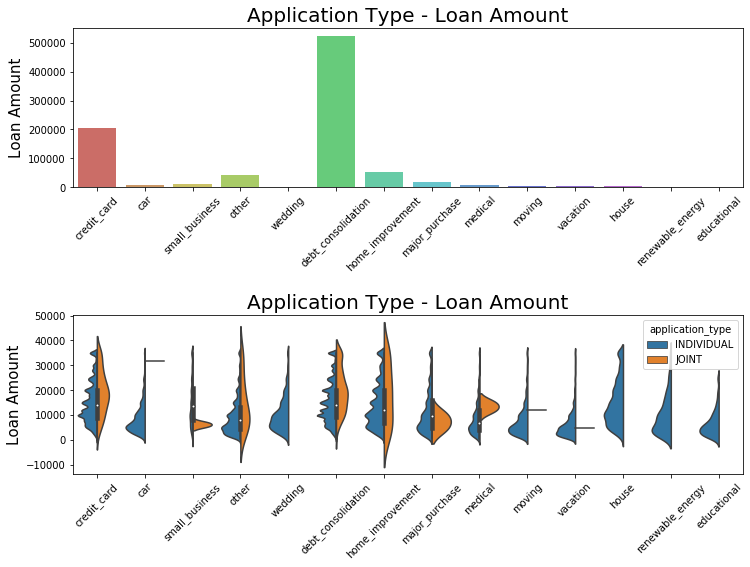

In [336]:
# Now will start exploring the Purpose variable
print("Purposes count description: ")
print(pd.crosstab(df_loan.purpose, df_loan.application_type))

plt.figure(figsize = (12,8))

plt.subplot(211)
g = sns.countplot(x="purpose",data=df_loan,
                  palette='hls')
g.set_xticklabels(g.get_xticklabels(),rotation=45)
g.set_title("Application Type - Loan Amount", fontsize=20)
g.set_xlabel("", fontsize=15)
g.set_ylabel("Loan Amount", fontsize=15)

plt.subplot(212)
g1 = sns.violinplot(x="purpose",y="loan_amnt",data=df_loan,
               hue="application_type", split=True)
g1.set_xticklabels(g1.get_xticklabels(),rotation=45)
g1.set_title("Application Type - Loan Amount", fontsize=20)
g1.set_xlabel("", fontsize=15)
g1.set_ylabel("Loan Amount", fontsize=15)

plt.subplots_adjust(wspace = 0.2, hspace = 0.8,top = 0.9)
plt.show()

([<matplotlib.patches.Wedge at 0x7f8cce14dfd0>,
 [Text(0.02077654299108715, 1.0998037712525537, 'car'),
  Text(0.7864771311160754, 0.7690602851736836, 'credit_card'),
  Text(-0.38170717853300395, -1.031648985777805, 'debt_consolidation'),
  Text(-0.8234867319636641, 0.7292939066520472, 'educational'),
  Text(-0.6806883431879486, 0.8640968576774515, 'home_improvement'),
  Text(-0.508605392246745, 0.9866207756668897, 'house'),
  Text(-0.46337825331815274, 1.0525115649492018, 'major_purchase'),
  Text(-0.40939986971500236, 1.1280034338056508, 'medical'),
  Text(-0.40822805494452563, 1.2342405985690998, 'moving'),
  Text(-0.2882769141116284, 1.3699986937184565, 'other'),
  Text(-0.1560831605934629, 1.4918572475204037, 'renewable_energy'),
  Text(-0.10309295285380704, 1.596675246589576, 'small_business'),
  Text(-0.03219076332517454, 1.699695194661838, 'vacation'),
  Text(-0.010610386426541378, 1.7999687274227516, 'wedding')],
 [Text(0.013221436448873638, 0.699875127160716, '0.6%'),
  Text(

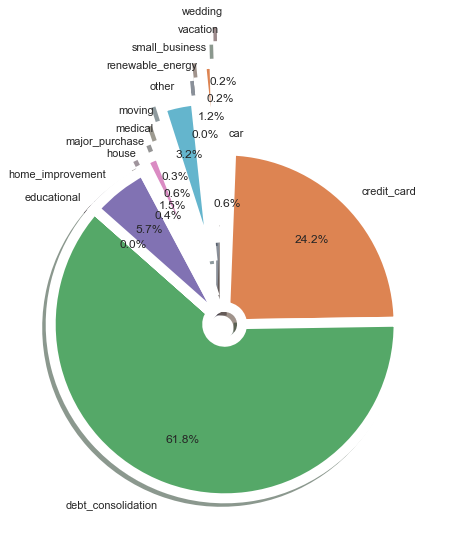

In [468]:
ploan = df_loan[['purpose', 'loan_amnt']].groupby(df_loan.purpose).sum()
ploan = ploan.reset_index()

explode = (0, 0, 0, 0, 0, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7)

fig, ax1 = plt.subplots()
ax1.pie(x = ploan['loan_amnt'], labels=ploan['purpose'],
        explode=explode, autopct='%.1f%%', pctdistance=0.7,  shadow=True, startangle=90,
        counterclock=False, wedgeprops=dict(edgecolor='w', width=0.9, linewidth=10))

<Figure size 1728x720 with 0 Axes>

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

application_type,INDIVIDUAL,JOINT
purpose,,
car,8862.0,1.0
credit_card,206067.0,115.0
debt_consolidation,523881.0,334.0
educational,423.0,0.0
home_improvement,51803.0,26.0
house,3707.0,0.0
major_purchase,17275.0,2.0
medical,8538.0,2.0
moving,5413.0,1.0


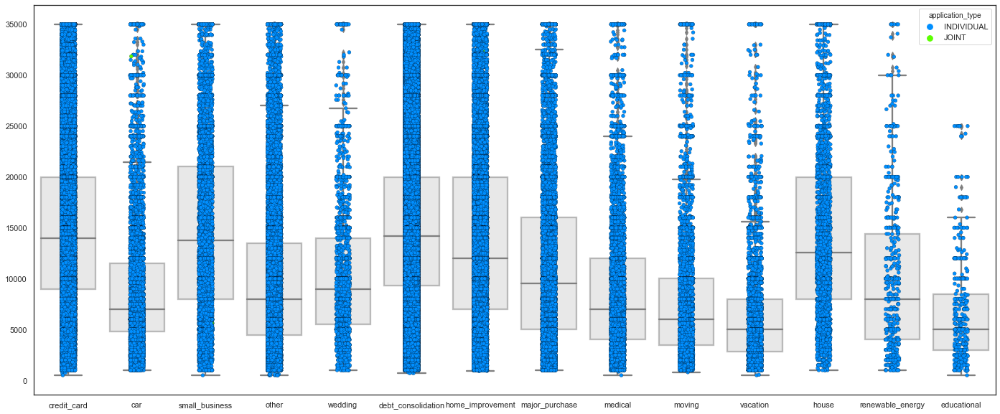

In [448]:
# Create boxplot
plt.figure(figsize=(24,10))
vendor_graph = sns.boxplot(x="purpose",y="loan_amnt",data=df_loan,
                          orient = 'v',color = 'lightgrey', linewidth = 2.3)
plt.setp(vendor_graph.artists, alpha = 0.5)

# Create strip plot
sns.stripplot(data=df_loan, x="purpose",y="loan_amnt", jitter = 1, size = 5,
             edgecolor = 'black', linewidth = .2, palette = 'gist_rainbow_r',
              hue = 'application_type')

# Remove the label of the x-axis
vendor_graph.xaxis.label.set_visible(False)
vendor_graph.yaxis.label.set_visible(False)

# Statistical summary
df_loan.groupby(['purpose','application_type'])['application_type'].count().unstack().fillna(0)

#### - Loan amount and grade

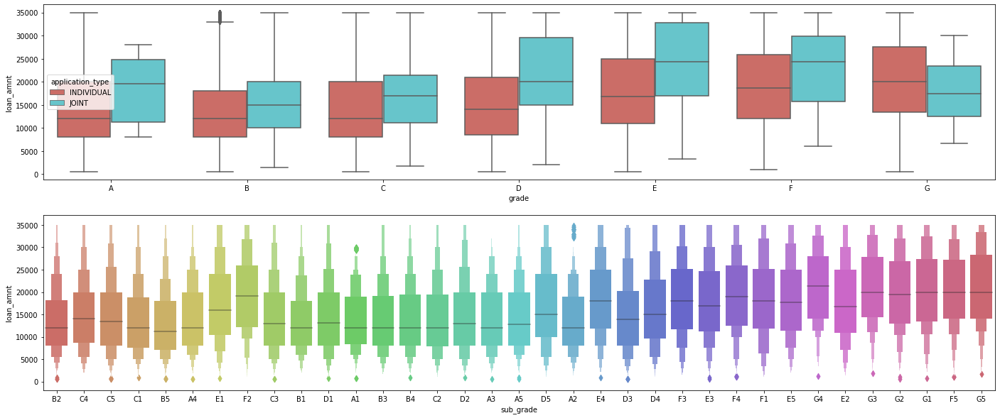

In [337]:
fig, ax = plt.subplots(2,1, figsize=(24,10))
sns.boxplot(x="grade", y="loan_amnt", data=df_loan,
            palette="hls",ax=ax[0], hue="application_type", 
            order=["A",'B','C','D','E','F', 'G'])

sns.lvplot(x="sub_grade", y="loan_amnt",data=df_loan, 
               palette="hls", ax=ax[1])

plt.show()

#### Loan amount by states

In [339]:
#Exploring the State Adress x Loan Status
adress_loan = ['addr_state', 'loan_status']
cm = sns.light_palette("lightblue", as_cmap=True)
pd.crosstab(df_loan[adress_loan[0]], df_loan[adress_loan[1]]).style.background_gradient(cmap = cm)

loan_status,Charged Off,Current,Default,Fully Paid,In Grace Period,Issued,Late (16-30 days),Late (31-120 days),NMCP Charged Off,NMCP Fully Paid
addr_state,,,,,,,,,,
AK,96,1469,2,567,15,14,6,31,1,4
AL,662,7576,9,2485,111,122,43,160,8,24
AR,337,4637,8,1417,57,70,13,86,6,9
AZ,1049,13577,39,5028,143,193,50,282,18,33
CA,7332,81851,211,35778,906,1147,327,1641,101,223
CO,784,12573,25,4829,106,166,57,202,13,52
CT,614,9353,8,3067,126,139,29,133,12,50
DC,87,1543,2,750,10,13,0,17,2,8
DE,121,1730,5,546,21,28,7,31,4,18


Now we will have a closer look at the operative side of business by state. This will give us a clearer idea in which state we have a higher operating activity. This will allow us to ask further questions such as Why do we have a higher level of operating activity in this state? Could it be because of economic factors? or the risk level is low and returns are fairly decent? Let's explore!

We will focus on three key metrics: Loans issued by state (Total Sum), Average interest rates charged to customers and average annual income of all customers by state. The purpose of this analysis is to see states that give high returns at a descent risk.

**Summary:**
California, Texas, New York and Florida are the states in which the highest amount of loans were issued. Interesting enough, all four states have a approximate interest rate of 13% which is at the same level of the average interest rate for all states (13.24%) California, Texas and New York are all above the average annual income (with the exclusion of Florida), this might give possible indication why most loans are issued in these states.

In [1]:
import plotly.offline as py

def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))
configure_plotly_browser_state()
py.init_notebook_mode(connected=False)

In [395]:
tloan = df_loan[['addr_state', 'loan_amnt']].groupby(df_loan.addr_state).sum()
tloan = tloan.reset_index()
tloan

,addr_state,loan_amnt
0,AK,3.697805e+07
1,AL,1.646276e+08
2,AR,9.341608e+07
3,AZ,2.901101e+08
4,CA,1.898145e+09
5,CO,2.810934e+08
6,CT,2.029568e+08
7,DC,3.688848e+07
8,DE,3.691610e+07
9,FL,8.489891e+08


In [418]:
fig = go.Figure(data=go.Choropleth(
    locations=tloan['addr_state'], # Spatial coordinates
    z = tloan['loan_amnt'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Blues',
    autocolorscale=False,
    marker_line_color='white',
    colorbar_title = "USD",
))

fig.update_layout(
    title_text = 'Loan amount and states',
    geo_scope='usa', # limite map scope to USA
)

<Figure size 1200x2000 with 0 Axes>

([<matplotlib.axis.YTick at 0x7f8cceaff9d0>,
 <a list of 51 Text yticklabel objects>)

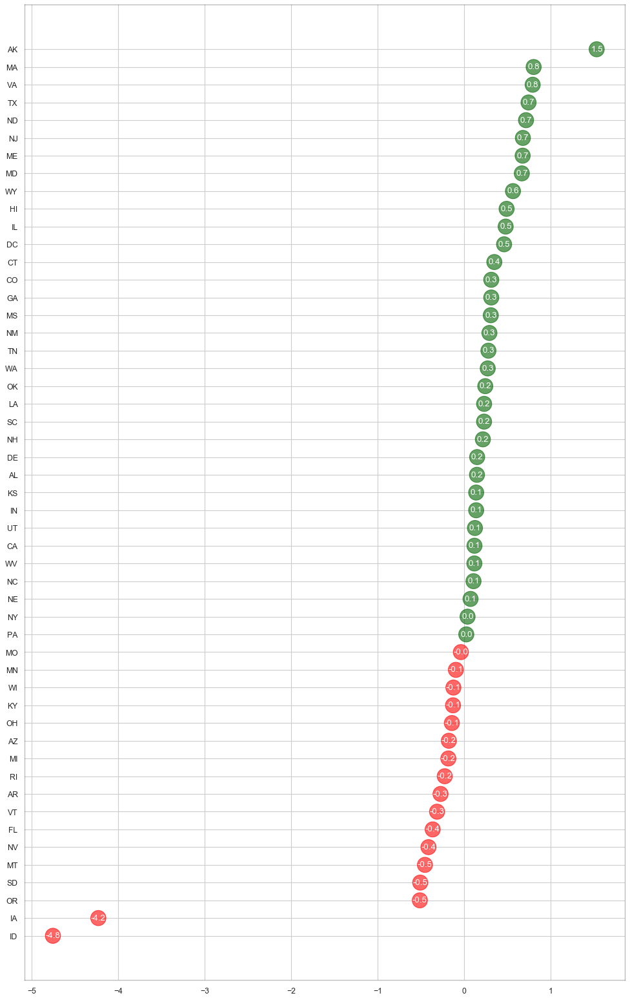

In [431]:
average_amnt = df_loan[['loan_amnt']].groupby(df_loan.addr_state).mean()
average_amnt = pd.DataFrame(average_amnt)
average_amnt['aps']=(average_amnt['loan_amnt']-average_amnt['loan_amnt'].mean())/average_amnt['loan_amnt'].std()
average_amnt['colors'] = ['red' if x < 0 else 'darkgreen' for x in average_amnt['aps']]

average_amnt.sort_values('aps', inplace=True)
average_amnt.reset_index(inplace=True)

# Draw plot
plt.figure(figsize=(15,25), dpi= 80)
plt.scatter(average_amnt.aps, average_amnt.index, s=450, alpha=.6, color=average_amnt.colors)
for x, y, tex in zip(average_amnt.aps, average_amnt.index, average_amnt.aps):
    t = plt.text(x, y, round(tex, 1), horizontalalignment='center',
                 verticalalignment='center', fontdict={'color':'white'})

# Decorations
# Lighten borders
plt.gca().spines["top"].set_alpha(.3)
plt.gca().spines["bottom"].set_alpha(.3)
plt.gca().spines["right"].set_alpha(.3)
plt.gca().spines["left"].set_alpha(.3)

plt.grid()
plt.yticks(average_amnt.index,average_amnt.addr_state)
plt.show()

#### Correlation

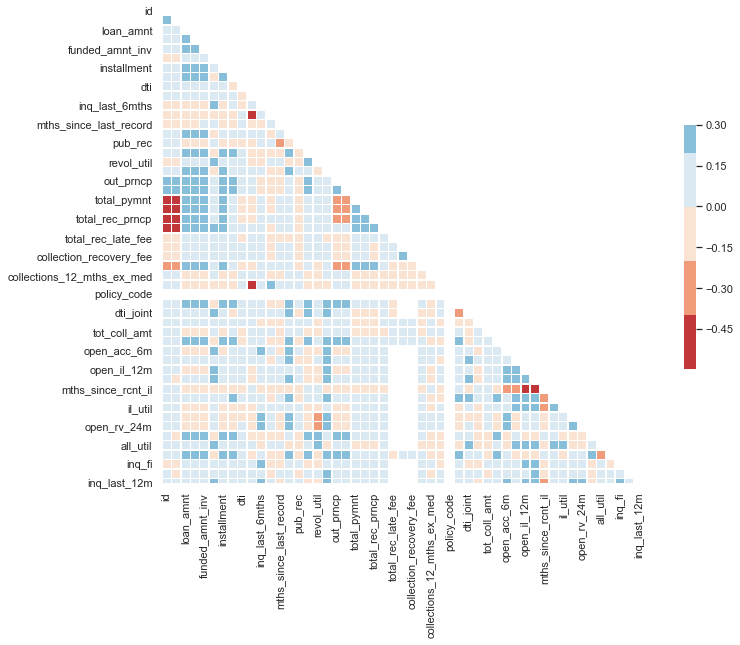

In [373]:
from string import ascii_letters
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style="white")

# Compute the correlation matrix
corr = df_loan.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.color_palette("RdBu")

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

### Data processing-Missing data

In [223]:
total = np.product(df.shape) 
miss_values = df.isnull().sum().sum() 

print(total)
print(miss_values)

65666046
17998490


In [224]:
per_total = (miss_values/total)*100
print(f"The total percentage of missing values in data set is {(per_total)}")

The total percentage of missing values in data set is 27.409127085251946


<Figure size 1080x360 with 0 Axes>

([<matplotlib.axis.XTick at 0x7f8d55ec9350>,
 <a list of 77 Text xticklabel objects>)

Text(0, 0.5, '% missing data')

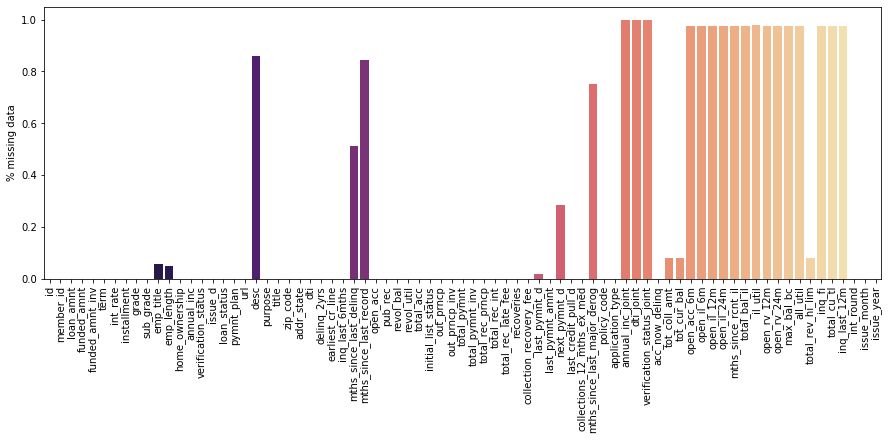

In [340]:
null_perc = df_loan.isnull().sum()/df_loan.isnull().count()

plt.figure(figsize=(15,5))

sns.barplot(x = np.arange(len(null_perc)), y =null_perc, palette="magma")

plt.xticks(np.arange(len(null_perc)),null_perc.index,rotation=90)
plt.ylabel('% missing data')

In [225]:
total_num = df.isnull().sum().sort_values(ascending=False)

perc = df.isnull().sum()/df.isnull().count() *100
perc1 = (round(perc,2).sort_values(ascending=False))

# Creating a data frame:
df_miss = pd.concat([total_num, perc1], axis =1 , keys =["Total Missing Values", "Percentage %"]).sort_values(by ="Percentage %", ascending = False)

In [226]:
top_mis = df_miss[df_miss["Percentage %"]>0]
top_mis.reset_index(inplace=True)
top_mis

,index,Total Missing Values,Percentage %
0,dti_joint,886870,99.94
1,verification_status_joint,886868,99.94
2,annual_inc_joint,886868,99.94
3,il_util,868762,97.90
4,mths_since_rcnt_il,866569,97.65
5,inq_last_12m,866007,97.59
6,total_bal_il,866007,97.59
7,total_cu_tl,866007,97.59
8,max_bal_bc,866007,97.59
9,open_acc_6m,866007,97.59


In [227]:
# Step 1 Droping all the columns which have missing values more than 50% and the redundant columns
df.drop(top_mis[top_mis["Percentage %"]>50]["index"], axis = 1, inplace=True)

In [228]:
# Step 2 Dropping all other Redundant Columns With No Meaning on the Target Variable

df.drop(['title','earliest_cr_line','last_pymnt_d',
         'last_credit_pull_d','zip_code','addr_state',
         'next_pymnt_d',"policy_code", "id", "member_id",
         "emp_title","url","purpose"], axis = 1, inplace=True)

In [229]:
print(df['term'].unique())

[' 36 months' ' 60 months']


In [230]:
dictms = {' 36 months' : 36, ' 60 months':50}  
df['term'] = df['term'].replace(dictms) 
df.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,...,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,collections_12_mths_ex_med,application_type,acc_now_delinq,tot_coll_amt,tot_cur_bal,total_rev_hi_lim
0,5000.0,5000.0,4975.0,36,10.65,162.87,B,B2,10+ years,RENT,...,0.00,0.00,0.00,171.62,0.0,INDIVIDUAL,0.0,NaN,NaN,NaN
1,2500.0,2500.0,2500.0,50,15.27,59.83,C,C4,< 1 year,RENT,...,0.00,117.08,1.11,119.66,0.0,INDIVIDUAL,0.0,NaN,NaN,NaN
2,2400.0,2400.0,2400.0,36,15.96,84.33,C,C5,10+ years,RENT,...,0.00,0.00,0.00,649.91,0.0,INDIVIDUAL,0.0,NaN,NaN,NaN
3,10000.0,10000.0,10000.0,36,13.49,339.31,C,C1,10+ years,RENT,...,16.97,0.00,0.00,357.48,0.0,INDIVIDUAL,0.0,NaN,NaN,NaN
4,3000.0,3000.0,3000.0,50,12.69,67.79,B,B5,1 year,RENT,...,0.00,0.00,0.00,67.79,0.0,INDIVIDUAL,0.0,NaN,NaN,NaN


In [231]:
print(df['emp_length'].unique())

['10+ years' '< 1 year' '1 year' '3 years' '8 years' '9 years' '4 years'
 '5 years' '6 years' '2 years' '7 years' nan]


In [232]:
dicty = {'10+ years':10, '< 1 year':0,
        '1 year':1, '3 years':3,
        '8 years':8, '9 years':9,
        '4 years':4, '5 years':5,
        '6 years':6, '2 years':2,
        '7 years':7 }  
df['emp_length'] = df['emp_length'].replace(dicty) 
df.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,...,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,collections_12_mths_ex_med,application_type,acc_now_delinq,tot_coll_amt,tot_cur_bal,total_rev_hi_lim
0,5000.0,5000.0,4975.0,36,10.65,162.87,B,B2,10.0,RENT,...,0.00,0.00,0.00,171.62,0.0,INDIVIDUAL,0.0,NaN,NaN,NaN
1,2500.0,2500.0,2500.0,50,15.27,59.83,C,C4,0.0,RENT,...,0.00,117.08,1.11,119.66,0.0,INDIVIDUAL,0.0,NaN,NaN,NaN
2,2400.0,2400.0,2400.0,36,15.96,84.33,C,C5,10.0,RENT,...,0.00,0.00,0.00,649.91,0.0,INDIVIDUAL,0.0,NaN,NaN,NaN
3,10000.0,10000.0,10000.0,36,13.49,339.31,C,C1,10.0,RENT,...,16.97,0.00,0.00,357.48,0.0,INDIVIDUAL,0.0,NaN,NaN,NaN
4,3000.0,3000.0,3000.0,50,12.69,67.79,B,B5,1.0,RENT,...,0.00,0.00,0.00,67.79,0.0,INDIVIDUAL,0.0,NaN,NaN,NaN


In [233]:
df['issue_month'], df['issue_year'] = df['issue_d'].str.split('-', 1).str
df=df.drop(['issue_d'],axis=1)
df.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,...,collection_recovery_fee,last_pymnt_amnt,collections_12_mths_ex_med,application_type,acc_now_delinq,tot_coll_amt,tot_cur_bal,total_rev_hi_lim,issue_month,issue_year
0,5000.0,5000.0,4975.0,36,10.65,162.87,B,B2,10.0,RENT,...,0.00,171.62,0.0,INDIVIDUAL,0.0,NaN,NaN,NaN,Dec,2011
1,2500.0,2500.0,2500.0,50,15.27,59.83,C,C4,0.0,RENT,...,1.11,119.66,0.0,INDIVIDUAL,0.0,NaN,NaN,NaN,Dec,2011
2,2400.0,2400.0,2400.0,36,15.96,84.33,C,C5,10.0,RENT,...,0.00,649.91,0.0,INDIVIDUAL,0.0,NaN,NaN,NaN,Dec,2011
3,10000.0,10000.0,10000.0,36,13.49,339.31,C,C1,10.0,RENT,...,0.00,357.48,0.0,INDIVIDUAL,0.0,NaN,NaN,NaN,Dec,2011
4,3000.0,3000.0,3000.0,50,12.69,67.79,B,B5,1.0,RENT,...,0.00,67.79,0.0,INDIVIDUAL,0.0,NaN,NaN,NaN,Dec,2011


In [234]:
print(df['issue_month'].unique())

['Dec' 'Nov' 'Oct' 'Sep' 'Aug' 'Jul' 'Jun' 'May' 'Apr' 'Mar' 'Feb' 'Jan']


In [235]:
dictm = {'Dec':12, 'Nov':11, 'Oct':10,
        'Sep':9, 'Aug':8, 'Jul':7,
        'Jun':6, 'May':5, 'Apr':4,
        'Mar':3, 'Feb':2, 'Jan':1}  
df['issue_month'] = df['issue_month'].replace(dictm) 
df.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,...,collection_recovery_fee,last_pymnt_amnt,collections_12_mths_ex_med,application_type,acc_now_delinq,tot_coll_amt,tot_cur_bal,total_rev_hi_lim,issue_month,issue_year
0,5000.0,5000.0,4975.0,36,10.65,162.87,B,B2,10.0,RENT,...,0.00,171.62,0.0,INDIVIDUAL,0.0,NaN,NaN,NaN,12,2011
1,2500.0,2500.0,2500.0,50,15.27,59.83,C,C4,0.0,RENT,...,1.11,119.66,0.0,INDIVIDUAL,0.0,NaN,NaN,NaN,12,2011
2,2400.0,2400.0,2400.0,36,15.96,84.33,C,C5,10.0,RENT,...,0.00,649.91,0.0,INDIVIDUAL,0.0,NaN,NaN,NaN,12,2011
3,10000.0,10000.0,10000.0,36,13.49,339.31,C,C1,10.0,RENT,...,0.00,357.48,0.0,INDIVIDUAL,0.0,NaN,NaN,NaN,12,2011
4,3000.0,3000.0,3000.0,50,12.69,67.79,B,B5,1.0,RENT,...,0.00,67.79,0.0,INDIVIDUAL,0.0,NaN,NaN,NaN,12,2011


In [236]:
print(df['issue_year'].unique())
dicty2 = {'2011':2011, '2010':2010, '2009':2009, '2008':2008,
        '2007':2007, '2013':2013, '2012':2012, '2014':2014, '2015':2015}  
df['issue_year'] = df['issue_year'].replace(dicty2) 

['2011' '2010' '2009' '2008' '2007' '2013' '2012' '2014' '2015']


In [237]:
# Returns the data frame of the repective data types
numb_cols = df.select_dtypes(include=("int64","float64"))
cat_cols = df.select_dtypes(include=("object"))

In [238]:
numb_cols.columns

Index(['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate',
       'installment', 'emp_length', 'annual_inc', 'dti', 'delinq_2yrs',
       'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util',
       'total_acc', 'out_prncp', 'out_prncp_inv', 'total_pymnt',
       'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_amnt', 'collections_12_mths_ex_med', 'acc_now_delinq',
       'tot_coll_amt', 'tot_cur_bal', 'total_rev_hi_lim', 'issue_month',
       'issue_year'],
      dtype='object')

In [239]:
cat_cols.columns

Index(['grade', 'sub_grade', 'home_ownership', 'verification_status',
       'loan_status', 'pymnt_plan', 'initial_list_status', 'application_type'],
      dtype='object')

In [240]:
df = pd.get_dummies(df,columns=['grade','sub_grade','home_ownership',
                                'verification_status','loan_status','pymnt_plan'
                                ,'initial_list_status','application_type'],drop_first=True)

In [241]:
df.to_csv("data_for_mice.csv")

In [242]:
dataset = pd.read_csv("data_for_mice.csv",header=0,encoding='utf-8')
df = dataset.copy()
df.head()

,Unnamed: 0,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,emp_length,annual_inc,dti,...,loan_status_Does not meet the credit policy. Status:Charged Off,loan_status_Does not meet the credit policy. Status:Fully Paid,loan_status_Fully Paid,loan_status_In Grace Period,loan_status_Issued,loan_status_Late (16-30 days),loan_status_Late (31-120 days),pymnt_plan_y,initial_list_status_w,application_type_JOINT
0,0,5000.0,5000.0,4975.0,36,10.65,162.87,10.0,24000.0,27.65,...,0,0,1,0,0,0,0,0,0,0
1,1,2500.0,2500.0,2500.0,50,15.27,59.83,0.0,30000.0,1.00,...,0,0,0,0,0,0,0,0,0,0
2,2,2400.0,2400.0,2400.0,36,15.96,84.33,10.0,12252.0,8.72,...,0,0,1,0,0,0,0,0,0,0
3,3,10000.0,10000.0,10000.0,36,13.49,339.31,10.0,49200.0,20.00,...,0,0,1,0,0,0,0,0,0,0
4,4,3000.0,3000.0,3000.0,50,12.69,67.79,1.0,80000.0,17.94,...,0,0,0,0,0,0,0,0,0,0


In [243]:
df.drop(['Unnamed: 0'],axis=1,inplace=True)

In [244]:
df.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,emp_length,annual_inc,dti,delinq_2yrs,...,loan_status_Does not meet the credit policy. Status:Charged Off,loan_status_Does not meet the credit policy. Status:Fully Paid,loan_status_Fully Paid,loan_status_In Grace Period,loan_status_Issued,loan_status_Late (16-30 days),loan_status_Late (31-120 days),pymnt_plan_y,initial_list_status_w,application_type_JOINT
0,5000.0,5000.0,4975.0,36,10.65,162.87,10.0,24000.0,27.65,0.0,...,0,0,1,0,0,0,0,0,0,0
1,2500.0,2500.0,2500.0,50,15.27,59.83,0.0,30000.0,1.00,0.0,...,0,0,0,0,0,0,0,0,0,0
2,2400.0,2400.0,2400.0,36,15.96,84.33,10.0,12252.0,8.72,0.0,...,0,0,1,0,0,0,0,0,0,0
3,10000.0,10000.0,10000.0,36,13.49,339.31,10.0,49200.0,20.00,0.0,...,0,0,1,0,0,0,0,0,0,0
4,3000.0,3000.0,3000.0,50,12.69,67.79,1.0,80000.0,17.94,0.0,...,0,0,0,0,0,0,0,0,0,0


In [245]:
display(df.dtypes)

loan_amnt                                                          float64
funded_amnt                                                        float64
funded_amnt_inv                                                    float64
term                                                                 int64
int_rate                                                           float64
installment                                                        float64
emp_length                                                         float64
annual_inc                                                         float64
dti                                                                float64
delinq_2yrs                                                        float64
inq_last_6mths                                                     float64
open_acc                                                           float64
pub_rec                                                            float64
revol_bal                

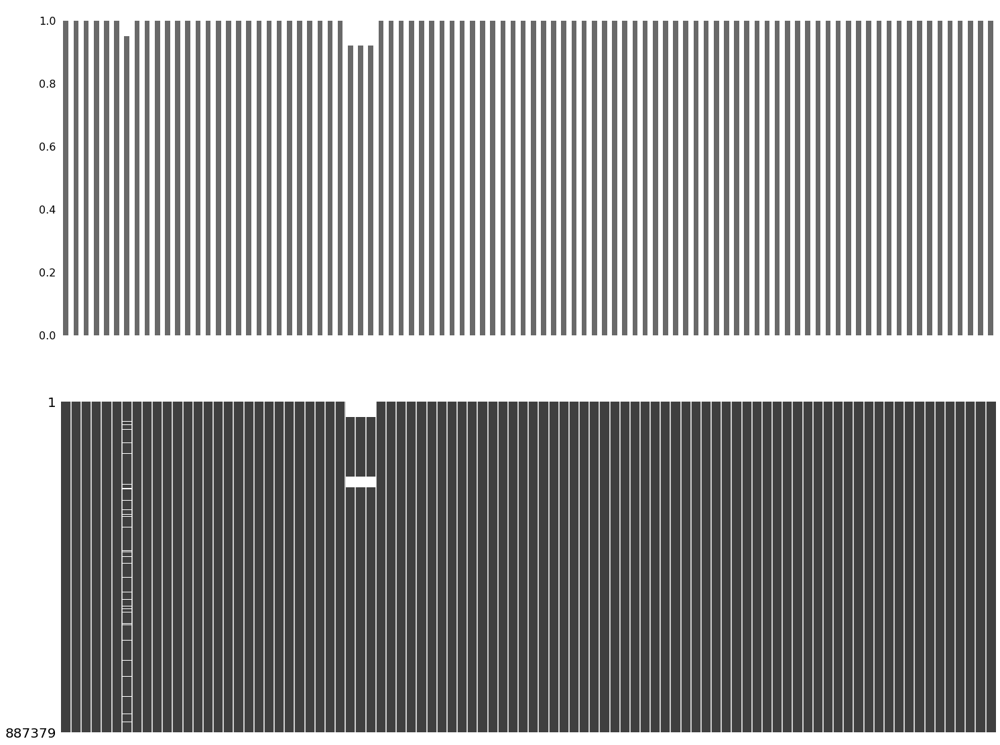

In [246]:
import missingno as msno
import matplotlib.pyplot as plt

f, (ax1, ax2) = plt.subplots(2,1, figsize=(25,20))

msno.bar(df,ax=ax1)
msno.matrix(df,ax=ax2)
plt.show()

In [247]:
import statsmodels
from fancyimpute import IterativeImputer
from impyute.imputation.cs import mice
from statsmodels.imputation.mice import MICEData

imp = statsmodels.imputation.mice.MICEData(df)
imp.set_imputer('x1', formula='x2 + np.square(x2) + x3')
for i in range(i):
    imp.update_all()
imp.data.to_csv("data_after_mice.csv")

### Normalize the data to bring it on the same scale with SKLearn

In [248]:
#import the necessary package
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from itertools import chain, combinations
from sklearn.model_selection import cross_val_score
from tqdm import tqdm
from sklearn.linear_model import Ridge
from sklearn.linear_model import LassoCV
from sklearn.preprocessing import Normalizer

import warnings
warnings.filterwarnings("ignore")

In [250]:
df = pd.read_csv("data_after_mice.csv",header=0,encoding='utf-8')
df.drop(['Unnamed: 0'],axis=1,inplace=True)
df

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,emp_length,annual_inc,dti,delinq_2yrs,...,loan_status_Does not meet the credit policy. Status:Charged Off,loan_status_Does not meet the credit policy. Status:Fully Paid,loan_status_Fully Paid,loan_status_In Grace Period,loan_status_Issued,loan_status_Late (16-30 days),loan_status_Late (31-120 days),pymnt_plan_y,initial_list_status_w,application_type_JOINT
0,5000.0,5000.0,4975.0,36,10.65,162.87,10.0,24000.0,27.65,0.0,...,0,0,1,0,0,0,0,0,0,0
1,2500.0,2500.0,2500.0,50,15.27,59.83,0.0,30000.0,1.00,0.0,...,0,0,0,0,0,0,0,0,0,0
2,2400.0,2400.0,2400.0,36,15.96,84.33,10.0,12252.0,8.72,0.0,...,0,0,1,0,0,0,0,0,0,0
3,10000.0,10000.0,10000.0,36,13.49,339.31,10.0,49200.0,20.00,0.0,...,0,0,1,0,0,0,0,0,0,0
4,3000.0,3000.0,3000.0,50,12.69,67.79,1.0,80000.0,17.94,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
887374,10000.0,10000.0,10000.0,36,11.99,332.10,8.0,31000.0,28.69,0.0,...,0,0,0,0,0,0,0,0,0,0
887375,24000.0,24000.0,24000.0,36,11.99,797.03,10.0,79000.0,3.90,0.0,...,0,0,0,0,0,0,0,0,0,0
887376,13000.0,13000.0,13000.0,50,15.99,316.07,5.0,35000.0,30.90,0.0,...,0,0,0,0,0,0,0,0,1,0
887377,12000.0,12000.0,12000.0,50,19.99,317.86,1.0,64400.0,27.19,1.0,...,0,0,0,0,0,0,0,0,1,0


In [251]:
#split the data in 2 dataframe 1 which needs to normalized 
X = df[['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term',
       'installment', 'emp_length', 'annual_inc', 'issue_month', 'issue_year',
       'dti', 'delinq_2yrs', 'inq_last_6mths', 'open_acc', 'pub_rec',
       'revol_bal', 'revol_util', 'total_acc', 'out_prncp', 'out_prncp_inv',
       'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_amnt', 'collections_12_mths_ex_med', 'acc_now_delinq',
       'tot_coll_amt', 'tot_cur_bal', 'total_rev_hi_lim', 
       'application_type_JOINT']].values
z = df [['grade_B', 'grade_C',
       'grade_D', 'grade_E', 'grade_F', 'grade_G', 'sub_grade_A2',
       'sub_grade_A3', 'sub_grade_A4', 'sub_grade_A5', 'sub_grade_B1',
       'sub_grade_B2', 'sub_grade_B3', 'sub_grade_B4', 'sub_grade_B5',
       'sub_grade_C1', 'sub_grade_C2', 'sub_grade_C3', 'sub_grade_C4',
       'sub_grade_C5', 'sub_grade_D1', 'sub_grade_D2', 'sub_grade_D3',
       'sub_grade_D4', 'sub_grade_D5', 'sub_grade_E1', 'sub_grade_E2',
       'sub_grade_E3', 'sub_grade_E4', 'sub_grade_E5', 'sub_grade_F1',
       'sub_grade_F2', 'sub_grade_F3', 'sub_grade_F4', 'sub_grade_F5',
       'sub_grade_G1', 'sub_grade_G2', 'sub_grade_G3', 'sub_grade_G4',
       'sub_grade_G5', 'home_ownership_MORTGAGE', 'home_ownership_NONE',
       'home_ownership_OTHER', 'home_ownership_OWN', 'home_ownership_RENT','verification_status_Verified',
       'loan_status_Current', 'loan_status_Default',
       'loan_status_Issued', 
     'pymnt_plan_y', 'initial_list_status_w','int_rate']]

In [252]:
#normalise the data
scaler = Normalizer().fit(X)
normalizedX = scaler.transform(X)
# summarize transformed data
np.set_printoptions(precision=3)
print(normalizedX[0:5,:])

[[3.417e-02 3.417e-02 3.400e-02 2.460e-04 1.113e-03 6.834e-05 1.640e-01
  8.201e-05 1.374e-02 1.890e-04 0.000e+00 6.834e-06 2.050e-05 0.000e+00
  9.327e-02 5.720e-04 6.151e-05 0.000e+00 0.000e+00 4.005e-02 3.985e-02
  3.417e-02 5.884e-03 0.000e+00 0.000e+00 0.000e+00 1.173e-03 0.000e+00
  0.000e+00 1.544e-03 9.530e-01 2.192e-01 0.000e+00]
 [1.709e-02 1.709e-02 1.709e-02 3.418e-04 4.089e-04 0.000e+00 2.051e-01
  8.202e-05 1.375e-02 6.835e-06 0.000e+00 3.418e-05 2.051e-05 0.000e+00
  1.153e-02 6.425e-05 2.734e-05 0.000e+00 0.000e+00 6.895e-03 6.895e-03
  3.120e-03 2.974e-03 0.000e+00 8.002e-04 7.587e-06 8.179e-04 0.000e+00
  0.000e+00 1.545e-03 9.532e-01 2.192e-01 0.000e+00]
 [1.669e-02 1.669e-02 1.669e-02 2.503e-04 5.864e-04 6.954e-05 8.519e-02
  8.344e-05 1.398e-02 6.063e-05 0.000e+00 1.391e-05 1.391e-05 0.000e+00
  2.055e-02 6.849e-04 6.954e-05 0.000e+00 0.000e+00 2.089e-02 2.089e-02
  1.669e-02 4.197e-03 0.000e+00 0.000e+00 0.000e+00 4.519e-03 0.000e+00
  0.000e+00 1.571e-03 9.697e-0

In [253]:
df1 = pd.DataFrame(normalizedX)

In [254]:
df1.columns = ['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term',
       'installment', 'emp_length', 'annual_inc', 'issue_month', 'issue_year',
       'dti', 'delinq_2yrs', 'inq_last_6mths', 'open_acc', 'pub_rec',
       'revol_bal', 'revol_util', 'total_acc', 'out_prncp', 'out_prncp_inv',
       'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_amnt', 'collections_12_mths_ex_med', 'acc_now_delinq',
       'tot_coll_amt', 'tot_cur_bal', 'total_rev_hi_lim', 
       'application_type_JOINT']

In [255]:
df1.to_csv('normalized.csv')

In [256]:
z.to_csv('dbv ')

In [257]:
df2 = pd.read_csv("data_after_mice.csv",header=0,encoding='utf-8')
df2.drop(['Unnamed: 0'],axis=1,inplace=True)

In [258]:
size = df2.shape[0]
rs = 1

Train, Test = train_test_split(df2, test_size= 0.3, random_state= rs)
CV, Test = train_test_split(Test, test_size=0.5, random_state = rs)

print(Train.shape, CV.shape, Test.shape)

(621165, 92) (133107, 92) (133107, 92)


#### Calculating the correlation with interest rate after normalization

Text(0.5, 0, 'Correlation with int_rate')

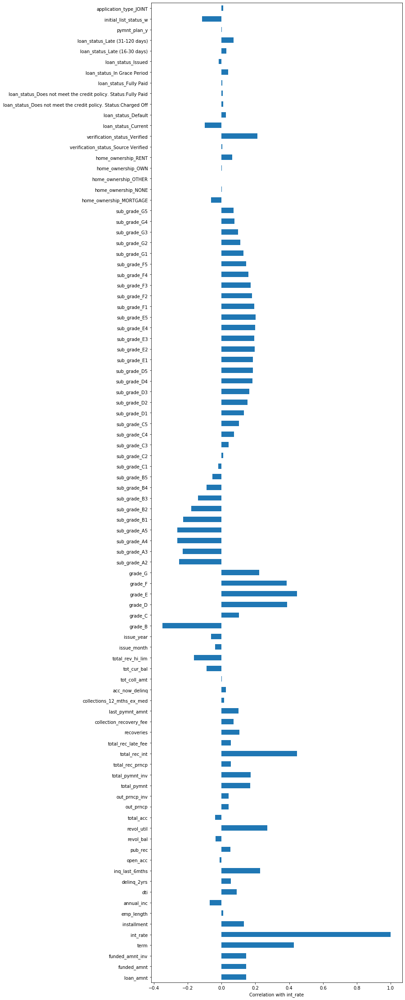

In [259]:
ax = Train.corr()['int_rate'].plot(kind = "barh",figsize = (10,40))
ax.set_xlabel('Correlation with int_rate')

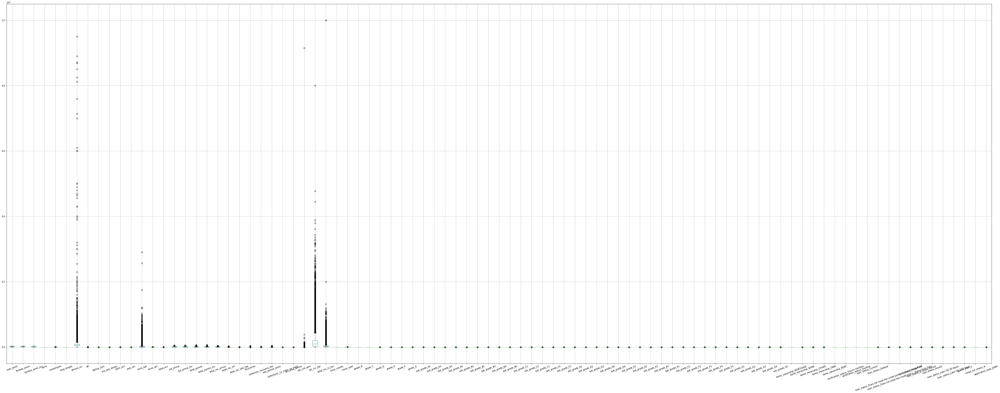

In [260]:
ax = Train.drop(["int_rate"], axis = 1).boxplot(figsize=(80,30),rot=20)

## 2. Feature Analysis and Selection

### -Implement LassoCV For Feature Selection

In [261]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from itertools import chain, combinations
from sklearn.model_selection import cross_val_score
from tqdm import tqdm
from sklearn.linear_model import Ridge
from sklearn.linear_model import LassoCV

from sklearn.preprocessing import StandardScaler

  
import warnings
warnings.filterwarnings("ignore")

In [263]:
df = pd.read_csv("data_after_mice.csv",header=0,encoding='utf-8')
df.drop(['Unnamed: 0'],axis=1,inplace=True)
df

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,emp_length,annual_inc,dti,delinq_2yrs,...,loan_status_Does not meet the credit policy. Status:Charged Off,loan_status_Does not meet the credit policy. Status:Fully Paid,loan_status_Fully Paid,loan_status_In Grace Period,loan_status_Issued,loan_status_Late (16-30 days),loan_status_Late (31-120 days),pymnt_plan_y,initial_list_status_w,application_type_JOINT
0,5000.0,5000.0,4975.0,36,10.65,162.87,10.0,24000.0,27.65,0.0,...,0,0,1,0,0,0,0,0,0,0
1,2500.0,2500.0,2500.0,50,15.27,59.83,0.0,30000.0,1.00,0.0,...,0,0,0,0,0,0,0,0,0,0
2,2400.0,2400.0,2400.0,36,15.96,84.33,10.0,12252.0,8.72,0.0,...,0,0,1,0,0,0,0,0,0,0
3,10000.0,10000.0,10000.0,36,13.49,339.31,10.0,49200.0,20.00,0.0,...,0,0,1,0,0,0,0,0,0,0
4,3000.0,3000.0,3000.0,50,12.69,67.79,1.0,80000.0,17.94,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
887374,10000.0,10000.0,10000.0,36,11.99,332.10,8.0,31000.0,28.69,0.0,...,0,0,0,0,0,0,0,0,0,0
887375,24000.0,24000.0,24000.0,36,11.99,797.03,10.0,79000.0,3.90,0.0,...,0,0,0,0,0,0,0,0,0,0
887376,13000.0,13000.0,13000.0,50,15.99,316.07,5.0,35000.0,30.90,0.0,...,0,0,0,0,0,0,0,0,1,0
887377,12000.0,12000.0,12000.0,50,19.99,317.86,1.0,64400.0,27.19,1.0,...,0,0,0,0,0,0,0,0,1,0


In [264]:
#split the data in train ,test , cv
size = df.shape[0]
rs = 1

Train, Test = train_test_split(df, test_size= 0.2, random_state= rs)
CV, Test = train_test_split(Test, test_size=0.5, random_state = rs)

print(Train.shape, CV.shape, Test.shape)

(709903, 92) (88738, 92) (88738, 92)


In [265]:
Train_y = np.array(Train["int_rate"])
CV_y = np.array(CV["int_rate"])
Test_y = np.array(Test["int_rate"])
Train_x = Train.drop(["int_rate"], axis = 1)
CV_x = CV.drop(["int_rate"], axis = 1)
Test_x = Test.drop(["int_rate"], axis = 1)

RMSE of Lasso:  0.6858287945889989


<Figure size 720x2880 with 0 Axes>

<BarContainer object of 91 artists>

Text(0, 0.5, 'Features -->')

Text(0.5, 0, 'Coefficents -->')

Text(0.5, 1.0, 'Coefficents from Lasso')

([<matplotlib.axis.YTick at 0x7f90429f6e10>,
 <a list of 91 Text yticklabel objects>)

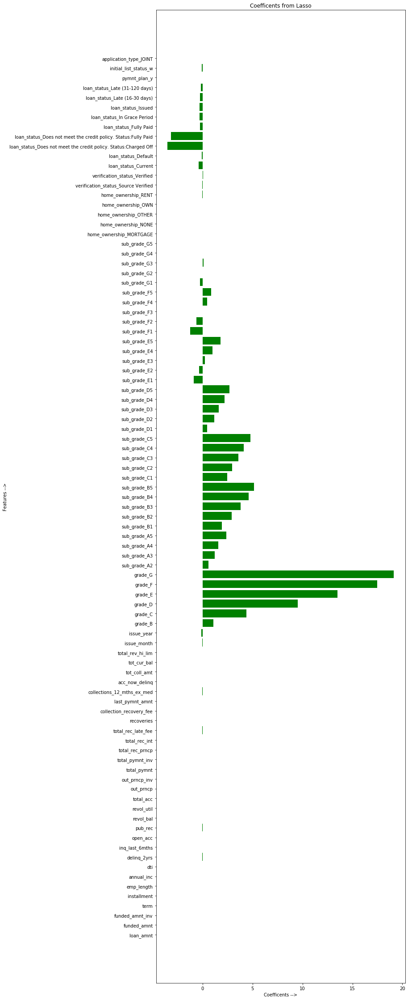

In [266]:
#perform lassocv for variable selection
modellasso = LassoCV(alphas = [1, 0.1, 0.001, 0.0001, 10, 1000]).fit(Train_x, Train_y)
lassopred = modellasso.predict(CV_x)
print("RMSE of Lasso: ", np.sqrt(mean_squared_error(lassopred, CV_y)))

coeff = modellasso.coef_

x = list(Train_x)
x_pos = [i for i, _ in enumerate(x)]


plt.figure(figsize = (10,40))
plt.barh(x_pos, coeff, color='green')
plt.ylabel("Features -->")
plt.xlabel("Coefficents -->")
plt.title("Coefficents from Lasso")
plt.yticks(x_pos, x)

plt.show()

### Shap, feature importance

In [1]:
#terminal: /bin/zsh -c "$(curl -fsSL https://gitee.com/cunkai/HomebrewCN/raw/master/Homebrew.sh)"
!pip install xgboost
import pandas as pd
import numpy as np
import xgboost as xgb
import scipy
import sklearn
from sklearn.model_selection import train_test_split

In [2]:
df = pd.read_csv("data_after_mice.csv",header=0,encoding='utf-8')
df.drop(['Unnamed: 0'],axis=1,inplace=True)

In [3]:
y=df['int_rate']
data_matrix = xgb.DMatrix(df,y)

In [4]:
size = df.shape[0]
rs = 1

Train, Test = train_test_split(df, test_size= 0.2, random_state= rs)
CV, Test = train_test_split(Test, test_size=0.5, random_state = rs)

In [5]:
Train_y = np.array(Train["int_rate"])
CV_y = np.array(CV["int_rate"])
Test_y = np.array(Test["int_rate"])
Train_x = Train.drop(["int_rate"], axis = 1)
CV_x = CV.drop(["int_rate"], axis = 1)
Test_x = Test.drop(["int_rate"], axis = 1)

In [6]:
xg_reg= xgb.XGBRegressor(
    objective='reg:squarederror',
    colsample_bytree=0.3,
    learning_rate=0.1,
    max_depth=5,
    n_estimators=10,
    alpha=10
)
xg_reg.fit(Train_x,Train_y)
pred = xg_reg.predict(Test_x)
sklearn.metrics.mean_squared_error(pred,Test_y)

28.283165287568654

In [7]:
params = {"objective":"reg:squarederror",'colsample_bytree': 0.3,'learning_rate': 0.1,
                'max_depth': 5, 'alpha': 10}
cv_results = xgb.cv(dtrain=data_matrix, params=params, nfold=3,
                    num_boost_round=50,early_stopping_rounds=10,metrics="rmse", as_pandas=True, seed=123)
cv_results.head()

,train-rmse-mean,train-rmse-std,test-rmse-mean,test-rmse-std
0,12.131668,0.003203,12.131064,0.006408
1,10.965772,0.031749,10.965333,0.036845
2,9.904765,0.070769,9.904503,0.070826
3,8.988990,0.064677,8.988951,0.064835
4,8.139773,0.087056,8.139871,0.084259


In [8]:
print((cv_results["test-rmse-mean"]).tail(1))

49    0.378176
Name: test-rmse-mean, dtype: float64


In [ ]:
#xgb.plot_importance(xg_reg)
#plt.rcParams['figure.figsize'] = [8, 17]
#plt.show()

In [3]:
import shap
shap.initjs()

In [10]:
import shap
# explain the model's predictions using SHAP values
explainer = shap.TreeExplainer(xg_reg)
shap_values = explainer.shap_values(Test_x)

# 对一个样本求shap值，各个特征对output所带来的变化
shap.force_plot(explainer.expected_value, shap_values[16,:], Test_x.iloc[16,:])

In [11]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[1:1000], Test_x[1:1000])

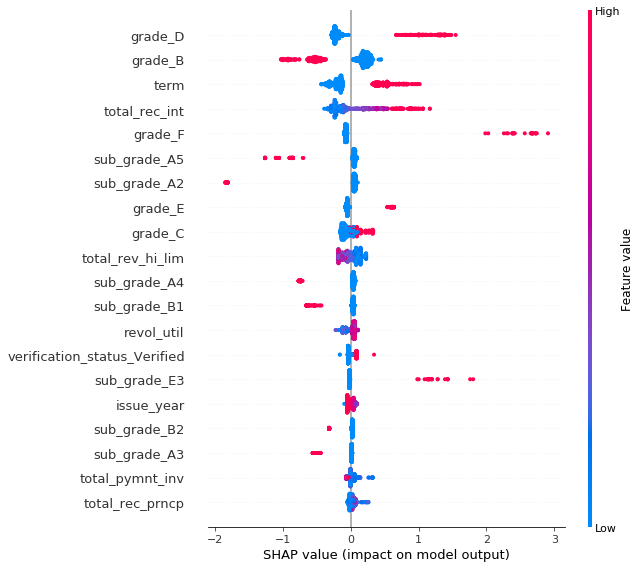

In [12]:
shap.initjs()
shap.summary_plot(shap_values[1:1000], Test_x[1:1000])

In [ ]:
shap.dependence_plot('total_rec_int', shap_values[0:1000], Test_x[0:1000], interaction_index=None, show=False)

### -Implementimg FeatureTools

In [267]:
import featuretools as ft

In [268]:
df = pd.read_csv("feature.csv",header=0,encoding='utf-8')
df

,issue_d,grade,sub_grade,term,addr_state
0,11-Dec-19,B,B2,36 months,AZ
1,11-Dec-19,C,C4,60 months,GA
2,11-Dec-19,C,C5,36 months,IL
3,11-Dec-19,C,C1,36 months,CA
4,11-Dec-19,B,B5,60 months,OR
...,...,...,...,...,...
887374,15-Jan-19,B,B5,36 months,CA
887375,15-Jan-19,B,B5,36 months,NJ
887376,15-Jan-19,D,D2,60 months,TN
887377,15-Jan-19,E,E3,60 months,MA


In [269]:
# Make an entityset and add the entity
es = ft.EntitySet(id = 'data')
es.entity_from_dataframe(entity_id = 'data', dataframe = df, 
                         make_index = True, index = 'index')

Entityset: data
  Entities:
    data [Rows: 887379, Columns: 6]
  Relationships:
    No relationships

In [270]:
ft.list_primitives()

,name,type,dask_compatible,koalas_compatible,description
0,std,aggregation,True,True,Computes the dispersion relative to the mean v...
1,min,aggregation,True,True,"Calculates the smallest value, ignoring `NaN` ..."
2,mean,aggregation,True,True,Computes the average for a list of values.
3,trend,aggregation,False,False,Calculates the trend of a variable over time.
4,median,aggregation,False,False,Determines the middlemost number in a list of ...
5,time_since_last,aggregation,False,False,Calculates the time elapsed since the last dat...
6,avg_time_between,aggregation,False,False,Computes the average number of seconds between...
7,any,aggregation,True,False,Determines if any value is 'True' in a list.
8,percent_true,aggregation,True,False,Determines the percent of `True` values.
9,first,aggregation,False,False,Determines the first value in a list.


In [271]:
# Run deep feature synthesis with transformation primitives
feature_matrix, feature_defs = ft.dfs(entityset = es, target_entity = 'data',
                                      trans_primitives = ['year', 'month'])

feature_matrix.head()

,grade,sub_grade,term,addr_state,MONTH(issue_d),YEAR(issue_d)
index,,,,,,
0,B,B2,36 months,AZ,12,2019
1,C,C4,60 months,GA,12,2019
2,C,C5,36 months,IL,12,2019
3,C,C1,36 months,CA,12,2019
4,B,B5,60 months,OR,12,2019


In [272]:
feature_matrix.to_csv('feature_gained.csv')

## 3. Models

We have used MAPE as an evaluation metrics for our models :

* MAPE : MAPE stands for Mean Average Percentage Error. The MAPE of a model gives us an idea about how well it can forecast. First, accuracy measurements are useful when deciding which model to use for forecasting. Typically, the model with the best (lowest) MAPE should be used for forecasting. We calculate the MAPE on a test set, a small period of observations that occur immediately prior to the start of our intended prediction. 

### -Linear Regression, Impletmenting Lasso and Ridge and Elastic Net Regularization

Linear regression is used to predict a quantitative response Y from the predictor variable X.
It is made with an assumption that there’s a linear relationship between X and Y.

Significance of parameters used :
1. Y (Target Variable) = Y is a required variable. We specify the column to use as the dependent variable.
For a regression model, this column must be numeric (Real or Int).
We have used  int_rate as a target variable because we have based all our evaluation and modelling with respect to interest rate.
2. X (Predictor Variable) = X is also required variable. We specify the names of the columns on which the target variable depends.These are called independent variables. We have used grade_C,grade_D,grade_E, grade_F,grade_G,total_rec_int,total_pymnt_inv,funded_amnt_inv,sub_grade_B5, sub_grade_B4,sub_grade_C5,sub_grade_C4,sub_grade_C3,sub_grade_B4,sub_grade_D5 as our predictor variable as after using feature selection tools like lasso cross validation and feature hasher we came to a conclusion that these are the best predictors.
3. Alpha = 	1

In [273]:
import numpy as np
import pandas as pd
import sklearn
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt 
from sklearn import metrics 
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet

%matplotlib inline

In [274]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [275]:
# Import the Dataset
dataset = pd.read_csv("data_after_mice.csv",header=0,encoding='utf-8')
df = dataset.copy()

In [276]:
dependent = df['int_rate']
df.drop(['int_rate'],axis=1,inplace=True)
independent = df

In [277]:
dependent.head()

0    10.65
1    15.27
2    15.96
3    13.49
4    12.69
Name: int_rate, dtype: float64

In [278]:
df.drop(['Unnamed: 0'],axis=1,inplace=True)
independent.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,installment,emp_length,annual_inc,dti,delinq_2yrs,inq_last_6mths,...,loan_status_Does not meet the credit policy. Status:Charged Off,loan_status_Does not meet the credit policy. Status:Fully Paid,loan_status_Fully Paid,loan_status_In Grace Period,loan_status_Issued,loan_status_Late (16-30 days),loan_status_Late (31-120 days),pymnt_plan_y,initial_list_status_w,application_type_JOINT
0,5000.0,5000.0,4975.0,36,162.87,10.0,24000.0,27.65,0.0,1.0,...,0,0,1,0,0,0,0,0,0,0
1,2500.0,2500.0,2500.0,50,59.83,0.0,30000.0,1.00,0.0,5.0,...,0,0,0,0,0,0,0,0,0,0
2,2400.0,2400.0,2400.0,36,84.33,10.0,12252.0,8.72,0.0,2.0,...,0,0,1,0,0,0,0,0,0,0
3,10000.0,10000.0,10000.0,36,339.31,10.0,49200.0,20.00,0.0,1.0,...,0,0,1,0,0,0,0,0,0,0
4,3000.0,3000.0,3000.0,50,67.79,1.0,80000.0,17.94,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [279]:
train_x, test_x, train_y, test_y = train_test_split(independent,dependent, test_size=0.3, random_state=42) 
train_x.shape

(621165, 91)

#### Setup Basic Models

In [280]:
lm_lasso = Lasso()
lm_ridge = Ridge()
lm_elastic = ElasticNet()

lm_lasso
lm_ridge
lm_elastic

Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False)

In [281]:
lm_lasso.fit(train_x, train_y)
lm_ridge.fit(train_x, train_y)
lm_elastic.fit(train_x, train_y)

Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False)

<Figure size 2160x5760 with 0 Axes>

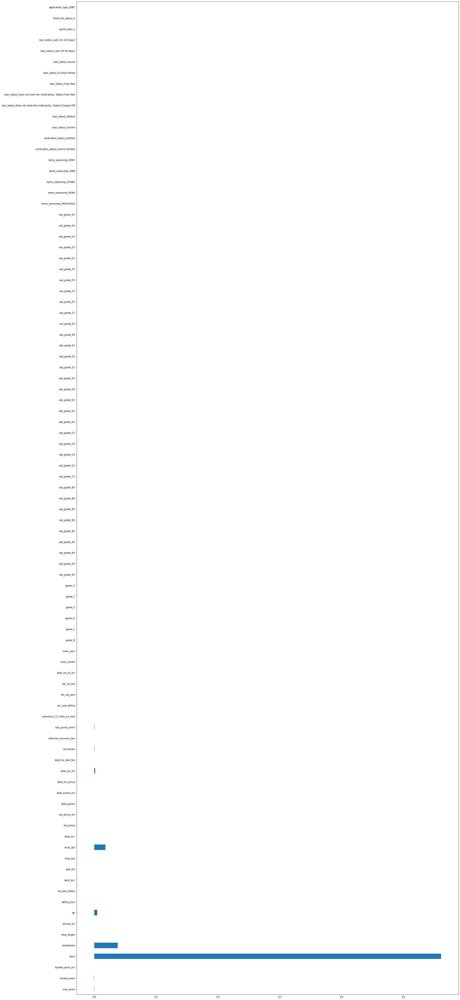

In [282]:
plt.figure(figsize=(30,80))
ft_importances_lm_lasso = pd.Series(lm_lasso.coef_, index = independent.columns)
ft_importances_lm_lasso.plot(kind='barh')
plt.show()

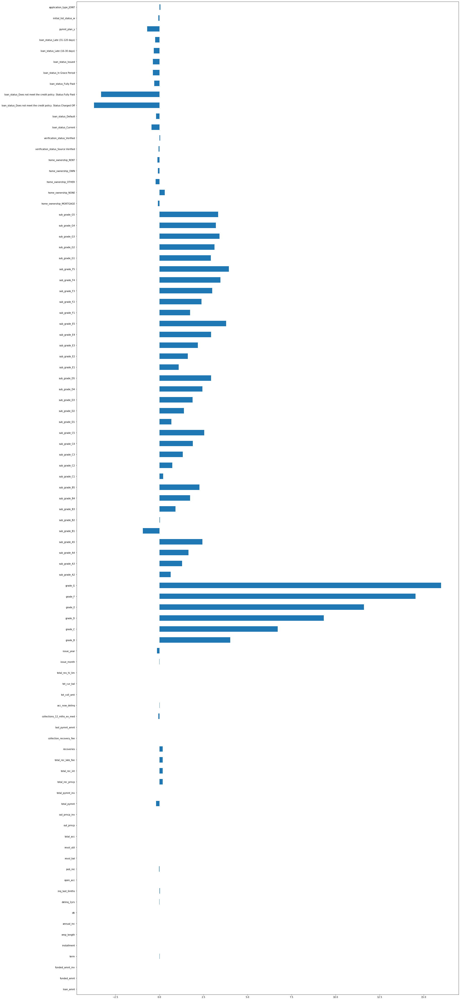

In [283]:
plt.figure(figsize=(30,80))
ft_importances_lm_ridge = pd.Series(lm_ridge.coef_, index = independent.columns)
ft_importances_lm_ridge.plot(kind='barh')
plt.show();

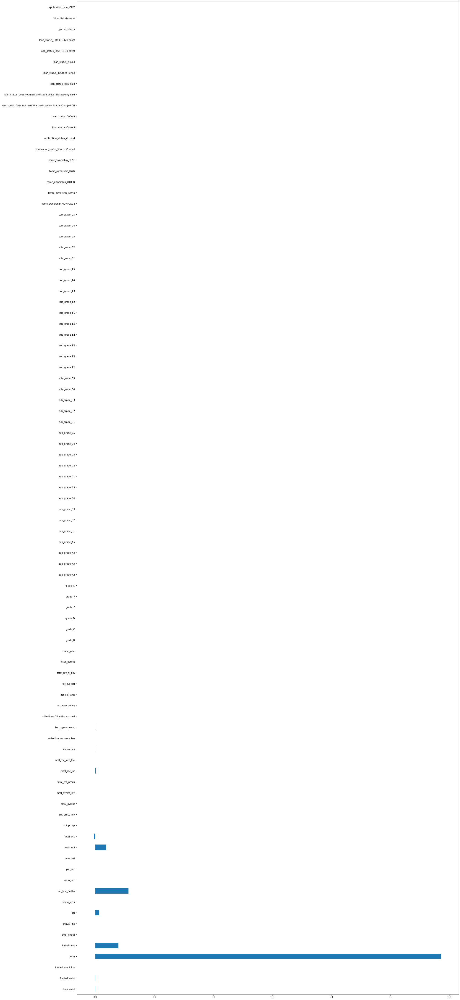

In [284]:
plt.figure(figsize=(30,80))
ft_importances_lm_elastic = pd.Series(lm_elastic.coef_, index = independent.columns)
ft_importances_lm_elastic.plot(kind='barh')
plt.show();

In [285]:
ft_importances_lm_elastic

loan_amnt                                                         -4.694636e-04
funded_amnt                                                       -7.040975e-04
funded_amnt_inv                                                   -1.402511e-05
term                                                               5.857903e-01
installment                                                        3.922506e-02
emp_length                                                        -0.000000e+00
annual_inc                                                        -2.007378e-06
dti                                                                6.837078e-03
delinq_2yrs                                                        0.000000e+00
inq_last_6mths                                                     5.638095e-02
open_acc                                                           0.000000e+00
pub_rec                                                            0.000000e+00
revol_bal                               

In [286]:
# R2 Value
print("RSquare Value for Lasso Regression Test Data is-")
np.round(lm_lasso.score(test_x,test_y)*100,2)

print("RSquare Value for Ridge Regression Test Data is-")
np.round(lm_ridge.score(test_x,test_y)*100,2)

print("RSquare Value for Elastic Net Regression Test Data is-")
np.round(lm_elastic.score(test_x,test_y)*100,2)

RSquare Value for Lasso Regression Test Data is-


60.41

RSquare Value for Ridge Regression Test Data is-


97.62

RSquare Value for Elastic Net Regression Test Data is-


60.99

In [287]:
# Predict on Training and Test Data
predict_test_lasso = lm_lasso.predict(test_x)
predict_test_ridge = lm_ridge.predict(test_x)
predict_test_elastic = lm_elastic.predict(test_x)

In [288]:
mse_lasso = np.round(metrics.mean_squared_error(test_y, predict_test_lasso),2)
errors_test_lasso = abs(predict_test_lasso - test_y)
mape_test_lasso = 100 * np.mean(errors_test_lasso / test_y)
accuracy_test_lasso = 100 - mape_test_lasso

print("Lasso Regression Mean Squared ERROR (MSE) for Test Data is {}".format(mse_lasso))
print("Lasso MAPE for Test Data is {}%".format(mape_test_lasso))
print("Lasso Accuracy for Test Data is {}%".format(accuracy_test_lasso))

mse_ridge = np.round(metrics.mean_squared_error(test_y, predict_test_ridge),2)
errors_test_ridge = abs(predict_test_ridge - test_y)
mape_test_ridge = 100 * np.mean(errors_test_ridge / test_y)
accuracy_test_ridge = 100 - mape_test_ridge

print("Ridge Regression Mean Squared ERROR (MSE) for Test Data is {}".format(mse_ridge))
print("Ridge MAPE for Test Data is {}%".format(mape_test_ridge))
print("Ridge Accuracy for Test Data is {}%".format(accuracy_test_ridge))

mse_elastic = np.round(metrics.mean_squared_error(test_y, predict_test_elastic),2)
errors_test_elastic = abs(predict_test_elastic - test_y)
mape_test_elastic = 100 * np.mean(errors_test_elastic / test_y)
accuracy_test_elastic = 100 - mape_test_elastic

print("Elastic Regression Mean Squared ERROR (MSE) for Test Data is {}".format(mse_elastic))
print("Elastic MAPE for Test Data is {}%".format(mape_test_elastic))
print("Elastic Accuracy for Test Data is {}%".format(accuracy_test_elastic))

Lasso Regression Mean Squared ERROR (MSE) for Test Data is 7.63
Lasso MAPE for Test Data is 18.571582384569286%
Lasso Accuracy for Test Data is 81.42841761543072%
Ridge Regression Mean Squared ERROR (MSE) for Test Data is 0.46
Ridge MAPE for Test Data is 3.528884560106567%
Ridge Accuracy for Test Data is 96.47111543989344%
Elastic Regression Mean Squared ERROR (MSE) for Test Data is 7.51
Elastic MAPE for Test Data is 18.381479984188672%
Elastic Accuracy for Test Data is 81.61852001581133%


#### Creating an Evaluation Function to Run Models

In [289]:
def evaluate(model,X_train,X_test,Y_train,Y_test):
    
    model.fit(X_train,Y_train)
    predictions_train = model.predict(X_train)
    predictions_test = model.predict(X_test)
    
    errors_train = abs(predictions_train - Y_train)
    errors_test = abs(predictions_test - Y_test)
    
    mape_train = 100 * np.mean(errors_train / Y_train)
    mape_test = 100 * np.mean(errors_test / Y_test)
    
    accuracy_train = 100 - mape_train
    accuracy_test = 100 - mape_test
    print('Model Performance')
    print('Average Error(Train Data): {:0.4f} of int rate.'.format(np.mean(errors_train)))
    print('Average Error(Test Data): {:0.4f} of int rate.'.format(np.mean(errors_test)))
    
    print('Accuracy(Train Data) = {:0.2f}%.'.format(accuracy_train))
    print('Accuracy(Test Data) = {:0.2f}%.'.format(accuracy_test))
    
    print('Mape(Train Data): {:0.4f} of int rate'.format(mape_train))
    print('Mape(Test Data): {:0.4f} of int rate'.format(mape_test))
 
    return accuracy_train,accuracy_test

#### Grid Search For Hyperparameter Tuning for all Models

In [290]:
import numpy as np
from sklearn import datasets
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
# load the diabetes datasets
dataset = datasets.load_diabetes()
# prepare a range of alpha values to test
alphas = np.array([1,0.1,0.01,0.001,0.0001,0])

In [295]:
del (dict)

In [296]:
# Tuning the Hyperparameter Alpha of Lasso Regression

model = Lasso()
grid_lasso = GridSearchCV(estimator=model, 
                          param_grid=dict(alpha=alphas))
grid_lasso.fit(train_x,train_y)
print(grid_lasso)

# summarize the results of the grid search
print(grid_lasso.best_score_)
print(grid_lasso.best_estimator_)

GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'alpha': array([1.e+00, 1.e-01, 1.e-02, 1.e-03, 1.e-04, 0.e+00])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'alpha': array([1.e+00, 1.e-01, 1.e-02, 1.e-03, 1.e-04, 0.e+00])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)
0.9758323914999512
Lasso(alpha=0.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)


In [297]:
model = Ridge()
grid_ridge = GridSearchCV(estimator=model, param_grid=dict(alpha=alphas))
grid_ridge.fit(train_x,train_y)
print(grid_ridge)

# summarize the results of the grid search
print(grid_ridge.best_score_)
print(grid_ridge.best_estimator_)

GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=None, normalize=False, random_state=None,
                             solver='auto', tol=0.001),
             iid='warn', n_jobs=None,
             param_grid={'alpha': array([1.e+00, 1.e-01, 1.e-02, 1.e-03, 1.e-04, 0.e+00])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=None, normalize=False, random_state=None,
                             solver='auto', tol=0.001),
             iid='warn', n_jobs=None,
             param_grid={'alpha': array([1.e+00, 1.e-01, 1.e-02, 1.e-03, 1.e-04, 0.e+00])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)
0.9758422098437594
Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)


In [298]:
# Tuning the Hyperparameter Alpha of Elastic Regression

model = ElasticNet()
grid_elastic = GridSearchCV(estimator=model, param_grid=dict(alpha=alphas))
grid_elastic.fit(train_x,train_y)
print(grid_elastic)

# summarize the results of the grid search
print(grid_elastic.best_score_)
print(grid_elastic.best_estimator_)

GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True,
                                  l1_ratio=0.5, max_iter=1000, normalize=False,
                                  positive=False, precompute=False,
                                  random_state=None, selection='cyclic',
                                  tol=0.0001, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'alpha': array([1.e+00, 1.e-01, 1.e-02, 1.e-03, 1.e-04, 0.e+00])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True,
                                  l1_ratio=0.5, max_iter=1000, normalize=False,
                                  positive=False, precompute=False,
                                  random_state=None, selection='cyclic',
                                  tol=0.0001, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'alpha': array([1.e+00, 1.e-01, 1.e-02, 1.e-03, 1.e-04, 0.e+00])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)
0.9758323914999512
ElasticNet(alpha=0.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False)


#### Running the Models With the Best Hyperparmeters

In [299]:
lm_lasso_best = Lasso(alpha=0.0, copy_X=True, fit_intercept=True, max_iter=1000,
                      normalize=False, positive=False, precompute=False, random_state=None,
                      selection='cyclic', tol=0.0001, warm_start=False)

evaluate(lm_lasso_best, train_x, test_x, train_y, test_y)

Model Performance
Average Error(Train Data): 0.4579 of int rate.
Average Error(Test Data): 0.4581 of int rate.
Accuracy(Train Data) = 96.47%.
Accuracy(Test Data) = 96.47%.
Mape(Train Data): 3.5266 of int rate
Mape(Test Data): 3.5302 of int rate


(96.47339413990562, 96.46975509856571)

In [300]:
lm_ridge_best = Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
                      normalize=False, random_state=None, solver='auto', tol=0.001)

evaluate(lm_ridge_best,train_x, test_x, train_y, test_y)

Model Performance
Average Error(Train Data): 0.4577 of int rate.
Average Error(Test Data): 0.4579 of int rate.
Accuracy(Train Data) = 96.47%.
Accuracy(Test Data) = 96.47%.
Mape(Train Data): 3.5255 of int rate
Mape(Test Data): 3.5289 of int rate


(96.47445865530888, 96.47111543989344)

In [301]:
lm_elastic_best = ElasticNet(alpha=0.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
                              max_iter=1000, normalize=False, positive=False, precompute=False,
                              random_state=None, selection='cyclic', tol=0.0001, warm_start=False)

evaluate(lm_elastic_best,train_x, test_x, train_y, test_y)

Model Performance
Average Error(Train Data): 0.4579 of int rate.
Average Error(Test Data): 0.4581 of int rate.
Accuracy(Train Data) = 96.47%.
Accuracy(Test Data) = 96.47%.
Mape(Train Data): 3.5266 of int rate
Mape(Test Data): 3.5302 of int rate


(96.47339413990562, 96.46975509856571)

We Chose the Hyperparameter "Alpha" to Tune

By Applying Hyperparameter Tuning on the Alpha Values of all the three algorithms, we can se that the Model Performance Improved Significantly.

### -Liner Regression with Cross Validation

In [475]:
df2=pd.read_csv('non_normalized_data.csv')
df1=pd.read_csv('normalized.csv')
result = pd.concat([df1, df2], axis=1)

In [483]:
df = pd.concat([df1, df2], axis=1)
df.drop(['Unnamed: 0'],axis=1,inplace=True)
df.tail()

,loan_amnt,funded_amnt,funded_amnt_inv,term,installment,emp_length,annual_inc,issue_month,issue_year,dti,...,home_ownership_OTHER,home_ownership_OWN,home_ownership_RENT,verification_status_Verified,loan_status_Current,loan_status_Default,loan_status_Issued,pymnt_plan_y,initial_list_status_w,int_rate
887374,0.198640,0.198640,0.198640,0.000715,0.006597,0.000159,0.615784,0.000020,0.040026,0.000570,...,0,0,1,1,1,0,0,0,0,11.99
887375,0.141806,0.141806,0.141806,0.000213,0.004709,0.000059,0.466779,0.000006,0.011906,0.000023,...,0,0,0,1,1,0,0,0,0,11.99
887376,0.215636,0.215636,0.215636,0.000829,0.005243,0.000083,0.580558,0.000017,0.033424,0.000513,...,0,0,1,1,1,0,0,0,1,15.99
887377,0.126156,0.126156,0.126156,0.000526,0.003342,0.000011,0.677040,0.000011,0.021184,0.000286,...,0,0,1,0,1,0,0,0,1,19.99
887378,0.159500,0.159500,0.159500,0.000287,0.005297,0.000080,0.797499,0.000008,0.016070,0.000086,...,0,0,1,1,1,0,0,0,0,11.99


In [484]:
#select the dependent(X) and independent variable (y)
X = df[['grade_C','grade_D','grade_E',
        'grade_F','grade_G','total_rec_int',
        'total_pymnt_inv','funded_amnt_inv','sub_grade_B5',
        'sub_grade_C5','sub_grade_C4','sub_grade_B4','sub_grade_D5','sub_grade_C3']].values

y = df[['int_rate']].values

In [485]:
#split the data in train test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=101)

In [486]:
#train the linear regression model
lm = LinearRegression()
lm.fit(X_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [487]:
#predict the interest rate
predictions = lm.predict(X_test)
predictionx = lm.predict(X_train)

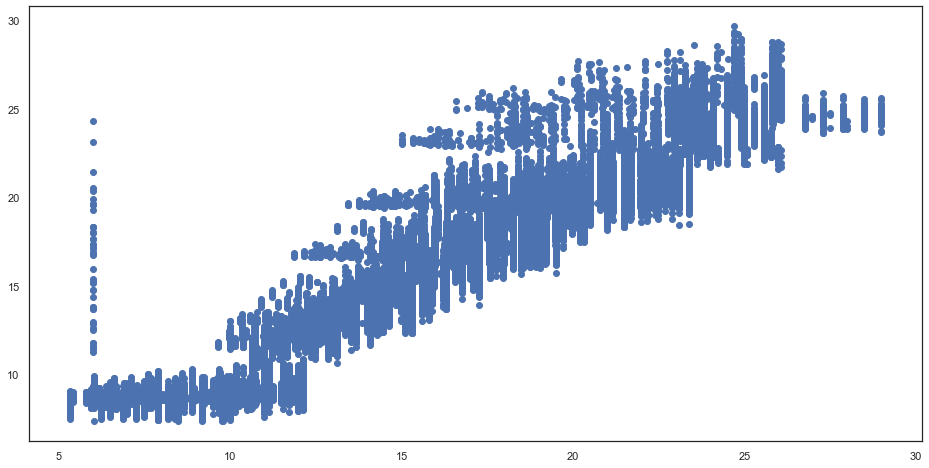

In [488]:
#plot the graph for relation ,on x-axis in is actuall interest rate and on the y axis there is predected interested rate
plt.scatter(y_test,predictions)

In [489]:
#calculate the r-square score
from sklearn.metrics import *
r2_score(y_test,predictions)

0.9208972068717073

In [490]:
# Calculate the absolute errors 
errors = abs(predictions - y_test) 
# Print out the mean absolute error (mae) 
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

Mean Absolute Error: 0.91 degrees.


In [491]:
# Calculate mean absolute percentage error (MAPE) 
mape = 100 * (errors / y_test) 
#print('MAPE:',mape)
# Calculate and display accuracy 
accuracy = 100 - np.mean(mape) 
print('Accuracy:', round(accuracy, 2), '%.')

Accuracy: 91.48 %.


In [492]:
test_int = y_test.tolist()
train_int = y_train.tolist()

In [493]:
#calculate mape
mape = np.mean(np.abs((test_int-predictions) / test_int)) * 100
print('MAPE of test data:',mape)
mape1 = np.mean(np.abs((train_int-predictionx) / train_int)) * 100
print('MAPE of train data:',mape1)

MAPE of test data: 8.517685129540919
MAPE of train data: 8.506494286461157


#### Map the residual against the predicted value ---the output is random and close to 0

<Figure size 720x720 with 0 Axes>

Text(0.5, 1.0, 'residual plot blue(test) and green(train)data')

Text(0, 0.5, 'residuals')

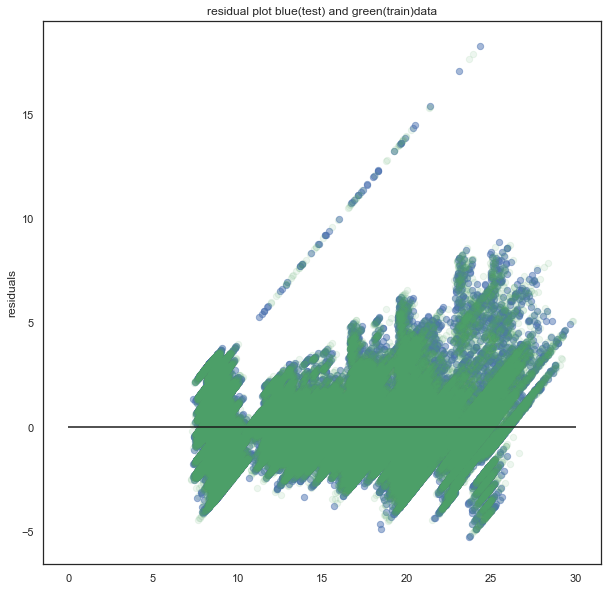

In [494]:
#plot the graph on x-axis there is predicted interest rate and on y-axis there is residual which means difference,
#the green colour are train data and blue is test data
plt.figure(figsize = (10,10))
plt.scatter(lm.predict(X_test),lm.predict(X_test) - test_int,c='b',s=40,alpha=0.5)
plt.scatter(lm.predict(X_train),lm.predict(X_train) - train_int,c='g',s=40,alpha=0.1)
plt.hlines(y=0,xmin=0,xmax=30)
plt.title('residual plot blue(test) and green(train)data')
plt.ylabel('residuals')

In [495]:
#calculte mape after 5 fold CV
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold
from math import fabs
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
cvscores =[]
kf = KFold(n_splits=5, random_state=42, shuffle=True)
i=1
model = LinearRegression()

for train_index, test_index in kf.split(X):
    X_trainD, X_testD = X[train_index], X[test_index]
    y_trainD, y_testD = y[train_index], y[test_index]
    i=i+(int(len(X_train)/5))
    model = LinearRegression()
    model.fit(X_trainD, y_trainD)
    pred= model.predict(X_testD)
    mape=np.mean(np.abs((y_testD-pred) / y_testD)) * 100
    cvscores.append(mape)
mape=np.mean(cvscores)
print('MAPE after 5 fold cross validation :')
print(mape)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

MAPE after 5 fold cross validation :
8.51454480318644


After 5 fold cross validation the MAPE value changed by 0.01

### -RandomForest

A Random Forest is an ensemble technique capable of performing both regression and classification tasks with the use of multiple decision trees

![rf](https://upload.wikimedia.org/wikipedia/commons/7/76/Random_forest_diagram_complete.png)

Significance of parameters used :
1. n_estimators : (number of trees)
2. random_state : seed : Specify the random number generator (RNG) seed for algorithm components dependent on randomization. The seed is consistent for each H2O instance so that you can create models with the same starting conditions in alternative configurations.

In [496]:
df2=pd.read_csv('non_normalized_data.csv')
df1=pd.read_csv('normalized.csv')
result = pd.concat([df1, df2], axis=1)
df = pd.concat([df1, df2], axis=1)
df.drop(['Unnamed: 0'],axis=1,inplace=True)

,loan_amnt,funded_amnt,funded_amnt_inv,term,installment,emp_length,annual_inc,issue_month,issue_year,dti,...,home_ownership_OTHER,home_ownership_OWN,home_ownership_RENT,verification_status_Verified,loan_status_Current,loan_status_Default,loan_status_Issued,pymnt_plan_y,initial_list_status_w,int_rate
887374,0.198640,0.198640,0.198640,0.000715,0.006597,0.000159,0.615784,0.000020,0.040026,0.000570,...,0,0,1,1,1,0,0,0,0,11.99
887375,0.141806,0.141806,0.141806,0.000213,0.004709,0.000059,0.466779,0.000006,0.011906,0.000023,...,0,0,0,1,1,0,0,0,0,11.99
887376,0.215636,0.215636,0.215636,0.000829,0.005243,0.000083,0.580558,0.000017,0.033424,0.000513,...,0,0,1,1,1,0,0,0,1,15.99
887377,0.126156,0.126156,0.126156,0.000526,0.003342,0.000011,0.677040,0.000011,0.021184,0.000286,...,0,0,1,0,1,0,0,0,1,19.99
887378,0.159500,0.159500,0.159500,0.000287,0.005297,0.000080,0.797499,0.000008,0.016070,0.000086,...,0,0,1,1,1,0,0,0,0,11.99


#### Features, Labels and Converting Data to Arrays

In [497]:
selected_features = ['grade_C','grade_D','grade_E',
                     'grade_F','grade_G','total_rec_int',
                     'total_pymnt_inv','funded_amnt_inv','sub_grade_B5',
                     'sub_grade_B4','sub_grade_C5','sub_grade_C4',
                     'sub_grade_C3','sub_grade_D5','int_rate']

features = df[selected_features]

In [498]:
# Converting Dataframes to Individual Arrays of Features and Labels to Fit to a Model
import numpy as np

# Labels are the values we want to predict
labels = np.array(features['int_rate'])

# Remove the labels from the features
# axis 1 refers to the columns
features= features.drop('int_rate', axis = 1)

# Saving feature names for later use
feature_list = list(features.columns)

# Convert to numpy array
features = np.array(features)

In [499]:
# Using Skicit-learn to split data into training and testing sets
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
train_features, test_features, train_labels, test_labels = train_test_split(features, labels, test_size = 0.25,
                                                                           random_state = 42)

print('Training Features Shape:', train_features.shape)
print('Testing Features Shape:', test_features.shape)
print('Training Labels Shape:', train_labels.shape)
print('Testing Labels Shape:', test_labels.shape)

Training Features Shape: (665534, 14)
Testing Features Shape: (221845, 14)
Training Labels Shape: (665534,)
Testing Labels Shape: (221845,)


#### Generate an Evaluation Function to Run the Model

In [500]:
def evaluate(model,X_train,X_test,Y_train,Y_test):
    
    model.fit(X_train,Y_train)
    predictions_train = model.predict(X_train)
    predictions_test = model.predict(X_test)
    
    errors_train = abs(predictions_train - Y_train)
    errors_test = abs(predictions_test - Y_test)
    
    mape_train = 100 * np.mean(errors_train / Y_train)
    mape_test = 100 * np.mean(errors_test / Y_test)
    
    accuracy_train = 100 - mape_train
    accuracy_test = 100 - mape_test
    print('Model Performance')
    print('Average Error(Train Data): {:0.4f} of int rate.'.format(np.mean(errors_train)))
    print('Average Error(Test Data): {:0.4f} of int rate.'.format(np.mean(errors_test)))
    
    print('Accuracy(Train Data) = {:0.2f}%.'.format(accuracy_train))
    print('Accuracy(Test Data) = {:0.2f}%.'.format(accuracy_test))
    
    print('Mape(Train Data): {:0.4f} of int rate'.format(mape_train))
    print('Mape(Test Data): {:0.4f} of int rate'.format(mape_test))
    
    plt.figure(figsize = (10,10))
    plt.scatter(predictions_train,(predictions_train - Y_train),c='g',s=40,alpha=0.5)
    plt.scatter(predictions_test,(predictions_test - Y_test),c='b',s=40,alpha=0.5)
    plt.hlines(y=0,xmin=0,xmax=30)
    plt.title('residual plot blue(test) and green(train)data')
    plt.ylabel('residuals')
    return accuracy_train,accuracy_test

#### Importing the Model and Providing the Necessary Parameters

Model Performance
Average Error(Train Data): 0.1687 of int rate.
Average Error(Test Data): 0.4374 of int rate.
Accuracy(Train Data) = 98.56%.
Accuracy(Test Data) = 96.25%.
Mape(Train Data): 1.4432 of int rate
Mape(Test Data): 3.7518 of int rate


(98.55681679939883, 96.24822419076544)

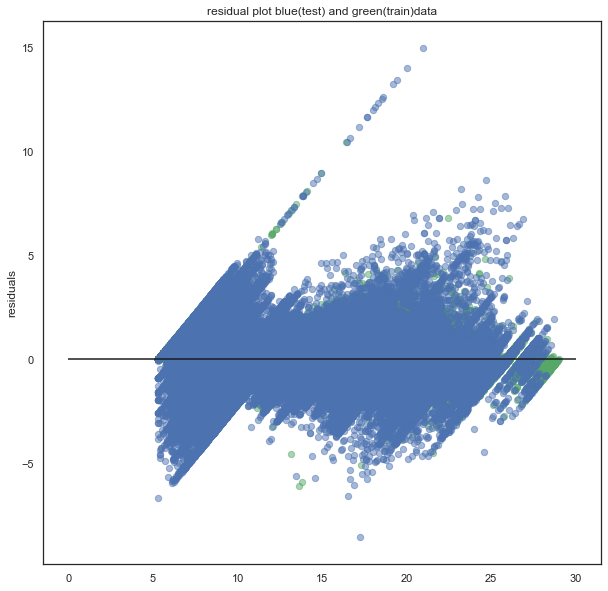

In [501]:
# Import the model we are using
from sklearn.ensemble import RandomForestRegressor

# Instantiate model (Using Default 10 Estimators)
rf = RandomForestRegressor(n_estimators= 10, random_state=42)

# Using Evaluation Function on our First Model

evaluate(rf, train_features, test_features, train_labels, test_labels)

#### Variable Importance

In [502]:
# Get numerical feature importances
importances = list(rf.feature_importances_)

# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_list, importances)]

# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)

# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: grade_D              Importance: 0.2
Variable: grade_E              Importance: 0.2
Variable: grade_F              Importance: 0.2
Variable: grade_C              Importance: 0.16
Variable: grade_G              Importance: 0.08
Variable: total_rec_int        Importance: 0.04
Variable: total_pymnt_inv      Importance: 0.03
Variable: sub_grade_B4         Importance: 0.03
Variable: funded_amnt_inv      Importance: 0.02
Variable: sub_grade_B5         Importance: 0.02
Variable: sub_grade_C5         Importance: 0.01
Variable: sub_grade_C4         Importance: 0.0
Variable: sub_grade_C3         Importance: 0.0
Variable: sub_grade_D5         Importance: 0.0


#### Implementing Model With the Most Important Features¶

Model Performance
Average Error(Train Data): 0.1816 of int rate.
Average Error(Test Data): 0.4688 of int rate.
Accuracy(Train Data) = 98.47%.
Accuracy(Test Data) = 96.03%.
Mape(Train Data): 1.5318 of int rate
Mape(Test Data): 3.9671 of int rate


(98.46820018738585, 96.03285960340047)

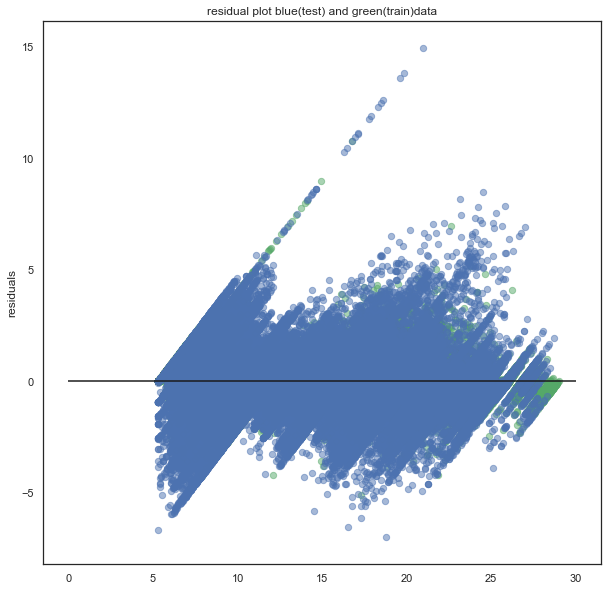

In [503]:
# New random forest with only the most important variables (Default 10 Estimators)

rf_most_important = RandomForestRegressor(n_estimators= 10, random_state=42)

# Extract the most important features

important_indices = [feature_list.index('grade_D'), feature_list.index('grade_E'), feature_list.index('grade_F'),
                     feature_list.index('grade_C'), feature_list.index('grade_G'), feature_list.index('total_rec_int'),
                     feature_list.index('total_pymnt_inv'), feature_list.index('funded_amnt_inv'),
                     feature_list.index('sub_grade_B4'),feature_list.index('sub_grade_B5'),feature_list.index('sub_grade_C5')]

train_important = train_features[:, important_indices]
test_important = test_features[:, important_indices]

#Evaluating the Model again with Best Features

evaluate(rf_most_important,train_important,test_important,train_labels,test_labels)

#### Examine the Default Random Forest to Determine Parameters

In [504]:
rf = RandomForestRegressor(n_estimators=10, random_state = 42)

from pprint import pprint

# Look at parameters used by our current forest

print('Parameters currently in use:\n')
pprint(rf.get_params())

Parameters currently in use:

{'bootstrap': True,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 10,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}


#### Random Search [Grid] With Cross Validation

In [505]:
from sklearn.model_selection import RandomizedSearchCV

# Number of trees in random forest
n_estimators = [10,20,30,50,100]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the grid

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

pprint(random_grid)

{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [10, 20, 30, 50, 100]}


In [513]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor(random_state = 42)

# Random search of parameters, using 5 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator=rf, param_distributions=random_grid,
                              n_iter = 10, scoring='neg_mean_absolute_error', 
                              cv = 5, verbose=2, random_state=42, n_jobs=1,
                              return_train_score=True)

# Fit the random search model
rf_random.fit(train_features, train_labels)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] n_estimators=10, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=100, bootstrap=True 
[CV]  n_estimators=10, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=100, bootstrap=True, total=  10.9s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   13.1s remaining:    0.0s


[CV] n_estimators=10, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=100, bootstrap=True 
[CV]  n_estimators=10, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=100, bootstrap=True, total=  10.5s
[CV] n_estimators=10, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=100, bootstrap=True 
[CV]  n_estimators=10, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=100, bootstrap=True, total=  10.6s
[CV] n_estimators=10, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=100, bootstrap=True 
[CV]  n_estimators=10, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=100, bootstrap=True, total=  11.1s
[CV] n_estimators=10, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=100, bootstrap=True 
[CV]  n_estimators=10, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=100, bootstrap=True, total=  11.6s
[CV] n_estimators=100, min_samples_s

[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed: 77.7min finished


RandomizedSearchCV(cv=5, error_score='raise-deprecating',
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators='warn',
                                                   n_jobs=None, oob_score=False,
                                                   random_sta...


In [514]:
rf_random.best_params_

{'n_estimators': 20,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': 60,
 'bootstrap': True}

In [515]:
rf_random.cv_results_

{'mean_fit_time': array([ 10.393, 384.581,   5.684,  23.947, 200.062,  53.499,  57.128,
          9.258, 112.59 ,  14.113]),
 'std_fit_time': array([0.429, 2.006, 0.041, 0.681, 1.192, 1.911, 0.845, 0.176, 1.492,
        0.616]),
 'mean_score_time': array([0.535, 5.28 , 0.079, 0.087, 2.955, 1.013, 1.212, 0.5  , 1.43 ,
        0.605]),
 'std_score_time': array([0.05 , 0.763, 0.002, 0.002, 0.251, 0.113, 0.036, 0.009, 0.151,
        0.022]),
 'param_n_estimators': masked_array(data=[10, 100, 10, 10, 50, 20, 50, 10, 30, 10],
              mask=[False, False, False, False, False, False, False, False,
                    False, False],
        fill_value='?',
             dtype=object),
 'param_min_samples_split': masked_array(data=[5, 2, 5, 2, 2, 2, 5, 2, 10, 5],
              mask=[False, False, False, False, False, False, False, False,
                    False, False],
        fill_value='?',
             dtype=object),
 'param_min_samples_leaf': masked_array(data=[1, 4, 1, 2, 2, 2, 2, 2,

Model Performance
Average Error(Train Data): 0.2369 of int rate.
Average Error(Test Data): 0.4574 of int rate.
Accuracy(Train Data) = 97.99%.
Accuracy(Test Data) = 96.13%.
Mape(Train Data): 2.0141 of int rate
Mape(Test Data): 3.8728 of int rate


(97.98592830634998, 96.12724891724497)

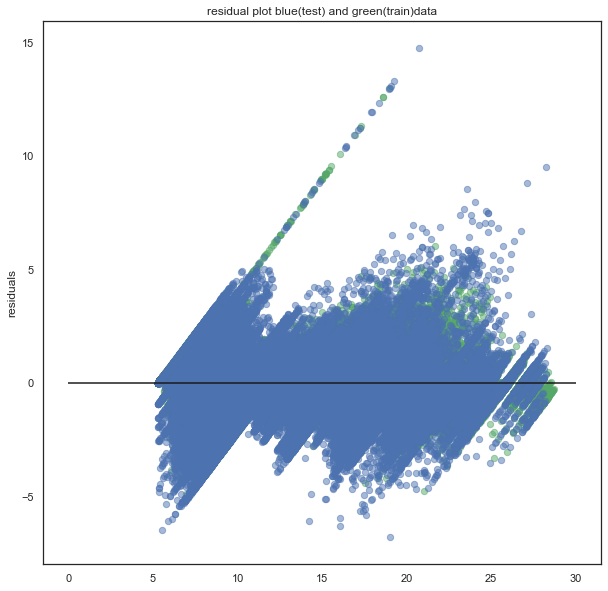

In [516]:
# Evaluate the Random Forest Model wil the Best Parameters

rf_best = RandomForestRegressor(n_estimators= 20,
 min_samples_split=2,
 min_samples_leaf=2,
 max_features='auto',
 max_depth=60,
 bootstrap=True)

evaluate(rf_best,train_important,test_important,train_labels,test_labels)

In [517]:
rf = RandomForestRegressor(n_estimators= 200,random_state=42)

Model Performance
Average Error(Train Data): 0.1546 of int rate.
Average Error(Test Data): 0.4197 of int rate.
Accuracy(Train Data) = 98.67%.
Accuracy(Test Data) = 96.39%.
Mape(Train Data): 1.3274 of int rate
Mape(Test Data): 3.6064 of int rate


(98.6725639542088, 96.39358269799874)

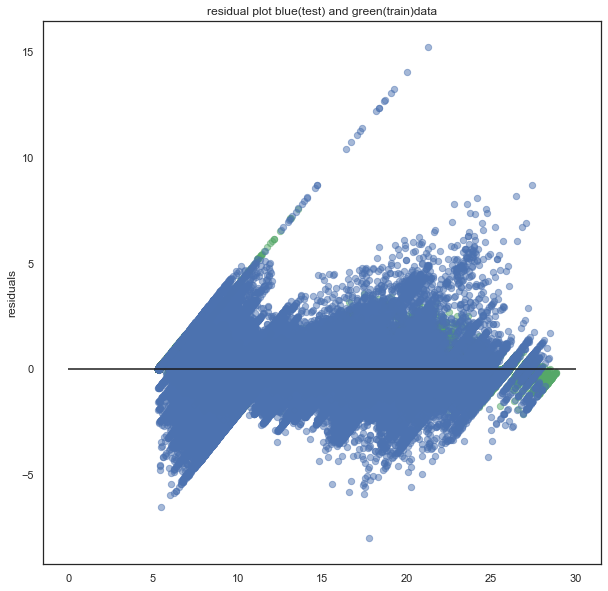

In [518]:
evaluate (rf,train_features,test_features,train_labels,test_labels)

Significance of parameters used :
1. n_estimators : (number of trees)
2. random_state : seed : Specify the random number generator (RNG) seed for algorithm components dependent on randomization. The seed is consistent for each H2O instance so that you can create models with the same starting conditions in alternative configurations.

### -Neural Network

Neural Networks are a class of models within the general machine learning literature. Neural networks are a specific set of algorithms that have revolutionized machine learning. They are inspired by biological neural networks and the current so-called deep neural networks have proven to work quite well

![nn](https://miro.medium.com/max/1063/0*u-AnjlGU9IxM5_Ju.png)

Significance of parameters used :

1. Optimizers : Gradient descent is an iterative machine learning optimization algorithm to reduce the cost function.
2. epochs : Specify the number of times to iterate (stream) the dataset. The value can be a fraction.
3. hidden: Specify the hidden layer sizes (e.g., 100,100). The value must be positive.
4. mini_batch_size: Specify a value for the mini-batch size. (Smaller values lead to a better fit; larger values can speed up and generalize better.)
5. activation: Specify the activation function (Tanh, Tanh with dropout, Rectifier, Rectifier with dropout, Maxout, Maxout with dropout).We used RELU (Rectified Linear Unit.).

In [519]:
df2=pd.read_csv('non_normalized_data.csv')
df1=pd.read_csv('normalized.csv')
result = pd.concat([df1, df2], axis=1)
df = pd.concat([df1, df2], axis=1)
df.drop(['Unnamed: 0'],axis=1,inplace=True)

In [520]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
# We have imported all dependencies
selected_features = ['grade_C','grade_D','grade_E',
        'grade_F','grade_G','total_rec_int',
        'total_pymnt_inv','funded_amnt_inv','sub_grade_B5',
        'sub_grade_B4','sub_grade_C5','sub_grade_C4','sub_grade_C3','sub_grade_D5','int_rate']
df=df[selected_features]

fullData = df

target_col = ["int_rate"]
cat_cols= []
num_cols= list(set(list(fullData.columns))-set(cat_cols)-set(target_col))
num_cat_cols = num_cols+cat_cols

In [521]:
for var in num_cat_cols:
    if fullData[var].isnull().any()==True:
        fullData[var+'_NA']=fullData[var].isnull()*1
#Impute numerical missing values with mean
fullData[num_cols] = fullData[num_cols].fillna(fullData[num_cols].mean())
#Impute categorical missing values with -9999
fullData[cat_cols] = fullData[cat_cols].fillna(value = -9999)
for var in cat_cols:
    number = LabelEncoder()
    fullData[var] = number.fit_transform(fullData[var].astype('str'))

features = list(set(list(fullData.columns))-set(target_col))
print(fullData[features].max())

fullData[features] = fullData[features]/fullData[features].max()
fullData[features]

grade_G            1.000000
total_rec_int      0.165241
sub_grade_C3       1.000000
total_pymnt_inv    0.387481
sub_grade_C5       1.000000
grade_E            1.000000
sub_grade_B5       1.000000
sub_grade_B4       1.000000
sub_grade_C4       1.000000
sub_grade_D5       1.000000
funded_amnt_inv    0.420228
grade_D            1.000000
grade_C            1.000000
grade_F            1.000000
dtype: float64


,grade_G,total_rec_int,sub_grade_C3,total_pymnt_inv,sub_grade_C5,grade_E,sub_grade_B5,sub_grade_B4,sub_grade_C4,sub_grade_D5,funded_amnt_inv,grade_D,grade_C,grade_F
0,0.0,0.035611,0.0,0.102854,0.0,0.0,0.0,0.0,0.0,0.0,0.080905,0.0,0.0,0.0
1,0.0,0.018000,0.0,0.017793,0.0,0.0,0.0,0.0,1.0,0.0,0.040663,0.0,1.0,0.0
2,0.0,0.025402,0.0,0.053902,1.0,0.0,0.0,0.0,0.0,0.0,0.039713,0.0,1.0,0.0
3,0.0,0.086965,0.0,0.205233,0.0,0.0,0.0,0.0,0.0,0.0,0.154781,0.0,1.0,0.0
4,0.0,0.036686,0.0,0.050267,0.0,0.0,1.0,0.0,0.0,0.0,0.042888,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
887374,0.0,0.123500,0.0,0.203616,0.0,0.0,1.0,0.0,0.0,0.0,0.472696,0.0,0.0,0.0
887375,0.0,0.088166,0.0,0.145357,0.0,0.0,1.0,0.0,0.0,0.0,0.337451,0.0,0.0,0.0
887376,0.0,0.193261,0.0,0.161376,0.0,0.0,0.0,0.0,0.0,0.0,0.513139,1.0,0.0,0.0
887377,0.0,0.142195,0.0,0.102766,0.0,1.0,0.0,0.0,0.0,0.0,0.300209,0.0,0.0,0.0


In [522]:
features=list(set(list(fullData.columns))-set(target_col))
X = fullData[features].values
y = fullData[target_col].values
X_train, X_valid, y_train,y_valid = train_test_split(X, y, test_size=0.20, random_state=42)

#### Model Implementation without Cross Validation

In [524]:
from keras.models import Sequential
from keras.layers import Activation, Dense,Dropout
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import mean_squared_error
from math import fabs
import matplotlib.pyplot as plt

cvscores =[]

model = Sequential()
model.add(Dense(50, input_dim=14, activation= "relu"))
model.add(Dense(25, activation= "relu"))
model.add(Dense(1, activation= "relu"))
model.compile(loss= "mean_squared_error" , optimizer="adam", metrics=["mean_squared_error"])
model.fit(X_train, y_train,batch_size=50, epochs=5,verbose=1)
pred= model.predict(X_valid)
mape=np.mean(np.abs((y_valid-pred) / y_valid)) * 100
print("Test Mape :"+str(mape))
print("Train Mape :"+str(mape))

Epoch 1/5
709903/709903 [==============================] - ETA: 33:48 - loss: 216.5700 - mean_squared_error: 216.570 - ETA: 48s - loss: 180.0345 - mean_squared_error: 180.0345  - ETA: 32s - loss: 142.8554 - mean_squared_error: 142.855 - ETA: 26s - loss: 103.5186 - mean_squared_error: 103.518 - ETA: 23s - loss: 79.0601 - mean_squared_error: 79.0601  - ETA: 20s - loss: 63.1610 - mean_squared_error: 63.161 - ETA: 19s - loss: 53.1651 - mean_squared_error: 53.165 - ETA: 18s - loss: 46.1861 - mean_squared_error: 46.186 - ETA: 17s - loss: 40.8994 - mean_squared_error: 40.899 - ETA: 17s - loss: 36.7347 - mean_squared_error: 36.734 - ETA: 17s - loss: 33.9654 - mean_squared_error: 33.965 - ETA: 16s - loss: 31.0714 - mean_squared_error: 31.071 - ETA: 16s - loss: 28.3765 - mean_squared_error: 28.376 - ETA: 16s - loss: 26.2367 - mean_squared_error: 26.236 - ETA: 15s - loss: 24.5687 - mean_squared_error: 24.568 - ETA: 15s - loss: 22.8928 - mean_squared_error: 22.892 - ETA: 15s - loss: 21.3483 - mean

Test Mape :5.4318122691046
Train Mape :5.4318122691046


<Figure size 720x720 with 0 Axes>

Text(0.5, 1.0, 'residual plot blue(test) and green(train)data')

Text(0, 0.5, 'residuals')

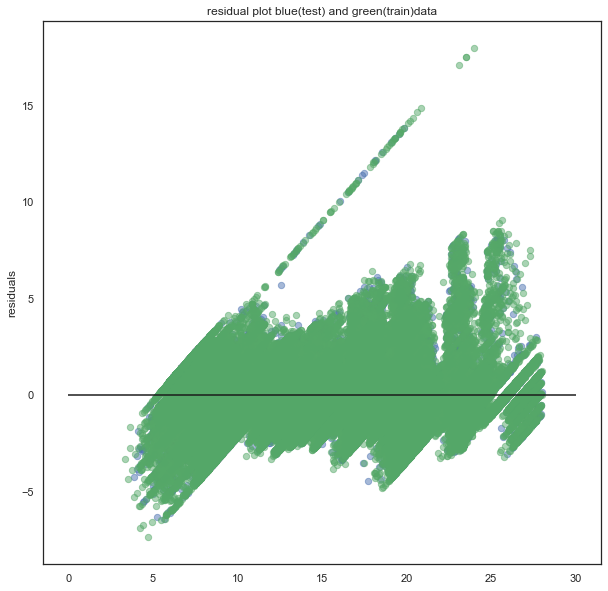

In [525]:
plt.figure(figsize = (10,10))
plt.scatter(pred,pred-y_valid,c='b',s=40,alpha=0.5)
plt.scatter(model.predict(X_train),model.predict(X_train) - y_train,c='g',s=40,alpha=0.5)
plt.hlines(y=0,xmin=0,xmax=30)
plt.title('residual plot blue(test) and green(train)data')
plt.ylabel('residuals')

#### Five Cross Validation

In [526]:
from keras.models import Sequential
from keras.layers import Activation, Dense,Dropout
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import mean_squared_error
from math import fabs
import matplotlib.pyplot as plt

kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
cvscores =[]

for train_index, test_index in kf.split(X):
    X_trainD, X_testD = X[train_index], X[test_index]
    y_trainD, y_testD = y[train_index], y[test_index]
    model = Sequential()
    model.add(Dense(50, input_dim=14, activation= "relu"))
    model.add(Dense(25, activation= "relu"))
    model.add(Dense(1, activation= "relu"))
    model.compile(loss= "mean_squared_error" , optimizer="adam", metrics=["mean_squared_error"])
    model.fit(X_trainD, y_trainD,batch_size=50, epochs=10)
    pred= model.predict(X_valid)
    mape=np.mean(np.abs((y_valid-pred) / y_valid)) * 100
    cvscores.append(mape)

Epoch 1/10
709903/709903 [==============================] - ETA: 37:11 - loss: 198.5963 - mean_squared_error: 198.596 - ETA: 1:17 - loss: 183.3502 - mean_squared_error: 183.350 - ETA: 49s - loss: 163.9133 - mean_squared_error: 163.9132 - ETA: 37s - loss: 128.4221 - mean_squared_error: 128.422 - ETA: 32s - loss: 100.6406 - mean_squared_error: 100.640 - ETA: 28s - loss: 80.6952 - mean_squared_error: 80.6951  - ETA: 26s - loss: 67.7587 - mean_squared_error: 67.758 - ETA: 25s - loss: 58.6699 - mean_squared_error: 58.669 - ETA: 24s - loss: 51.5614 - mean_squared_error: 51.561 - ETA: 23s - loss: 46.1679 - mean_squared_error: 46.167 - ETA: 22s - loss: 41.6093 - mean_squared_error: 41.609 - ETA: 22s - loss: 37.8798 - mean_squared_error: 37.879 - ETA: 21s - loss: 34.7087 - mean_squared_error: 34.708 - ETA: 20s - loss: 31.8210 - mean_squared_error: 31.821 - ETA: 20s - loss: 29.3846 - mean_squared_error: 29.384 - ETA: 19s - loss: 27.4428 - mean_squared_error: 27.442 - ETA: 19s - loss: 25.7506 - m

Epoch 1/10
709903/709903 [==============================] - ETA: 35:01 - loss: 187.6839 - mean_squared_error: 187.683 - ETA: 52s - loss: 182.4579 - mean_squared_error: 182.4579  - ETA: 34s - loss: 148.9263 - mean_squared_error: 148.926 - ETA: 27s - loss: 107.4904 - mean_squared_error: 107.490 - ETA: 23s - loss: 81.1346 - mean_squared_error: 81.1347  - ETA: 21s - loss: 64.1488 - mean_squared_error: 64.148 - ETA: 19s - loss: 53.2240 - mean_squared_error: 53.224 - ETA: 18s - loss: 45.4703 - mean_squared_error: 45.470 - ETA: 17s - loss: 39.9591 - mean_squared_error: 39.959 - ETA: 16s - loss: 35.6083 - mean_squared_error: 35.608 - ETA: 16s - loss: 32.3348 - mean_squared_error: 32.334 - ETA: 15s - loss: 29.4537 - mean_squared_error: 29.453 - ETA: 15s - loss: 27.2845 - mean_squared_error: 27.284 - ETA: 15s - loss: 25.4212 - mean_squared_error: 25.421 - ETA: 15s - loss: 23.8193 - mean_squared_error: 23.819 - ETA: 14s - loss: 22.3572 - mean_squared_error: 22.357 - ETA: 14s - loss: 21.0499 - mea

Epoch 1/10
709903/709903 [==============================] - ETA: 28:22 - loss: 188.5200 - mean_squared_error: 188.520 - ETA: 44s - loss: 173.9907 - mean_squared_error: 173.9907  - ETA: 30s - loss: 137.5148 - mean_squared_error: 137.514 - ETA: 25s - loss: 98.1033 - mean_squared_error: 98.1033  - ETA: 21s - loss: 72.1812 - mean_squared_error: 72.181 - ETA: 18s - loss: 56.6394 - mean_squared_error: 56.639 - ETA: 17s - loss: 46.9882 - mean_squared_error: 46.988 - ETA: 16s - loss: 40.0526 - mean_squared_error: 40.052 - ETA: 15s - loss: 35.1022 - mean_squared_error: 35.102 - ETA: 15s - loss: 31.1002 - mean_squared_error: 31.100 - ETA: 14s - loss: 27.9296 - mean_squared_error: 27.929 - ETA: 14s - loss: 25.3333 - mean_squared_error: 25.333 - ETA: 13s - loss: 23.2668 - mean_squared_error: 23.266 - ETA: 13s - loss: 21.5599 - mean_squared_error: 21.559 - ETA: 13s - loss: 20.0457 - mean_squared_error: 20.045 - ETA: 13s - loss: 18.8225 - mean_squared_error: 18.822 - ETA: 12s - loss: 17.6120 - mean_

Epoch 1/10
709903/709903 [==============================] - ETA: 29:33 - loss: 183.6772 - mean_squared_error: 183.677 - ETA: 47s - loss: 167.1656 - mean_squared_error: 167.1656  - ETA: 32s - loss: 124.2534 - mean_squared_error: 124.253 - ETA: 25s - loss: 86.8249 - mean_squared_error: 86.8250  - ETA: 21s - loss: 63.6096 - mean_squared_error: 63.609 - ETA: 19s - loss: 49.7974 - mean_squared_error: 49.797 - ETA: 17s - loss: 41.0824 - mean_squared_error: 41.082 - ETA: 16s - loss: 34.8334 - mean_squared_error: 34.833 - ETA: 15s - loss: 30.3678 - mean_squared_error: 30.367 - ETA: 14s - loss: 26.9597 - mean_squared_error: 26.959 - ETA: 14s - loss: 24.2640 - mean_squared_error: 24.263 - ETA: 14s - loss: 22.0827 - mean_squared_error: 22.082 - ETA: 13s - loss: 20.2992 - mean_squared_error: 20.299 - ETA: 13s - loss: 18.7271 - mean_squared_error: 18.727 - ETA: 13s - loss: 17.4647 - mean_squared_error: 17.464 - ETA: 12s - loss: 16.3935 - mean_squared_error: 16.393 - ETA: 12s - loss: 15.4015 - mean_

Epoch 1/10
709904/709904 [==============================] - ETA: 33:28 - loss: 211.8708 - mean_squared_error: 211.870 - ETA: 53s - loss: 163.9448 - mean_squared_error: 163.9448  - ETA: 34s - loss: 114.6699 - mean_squared_error: 114.670 - ETA: 26s - loss: 76.1599 - mean_squared_error: 76.1599  - ETA: 22s - loss: 56.0475 - mean_squared_error: 56.047 - ETA: 19s - loss: 44.7024 - mean_squared_error: 44.702 - ETA: 18s - loss: 37.0467 - mean_squared_error: 37.046 - ETA: 17s - loss: 31.9011 - mean_squared_error: 31.901 - ETA: 16s - loss: 27.7587 - mean_squared_error: 27.758 - ETA: 15s - loss: 24.6113 - mean_squared_error: 24.611 - ETA: 15s - loss: 22.2015 - mean_squared_error: 22.201 - ETA: 14s - loss: 20.2148 - mean_squared_error: 20.214 - ETA: 14s - loss: 18.5546 - mean_squared_error: 18.554 - ETA: 13s - loss: 17.1481 - mean_squared_error: 17.148 - ETA: 13s - loss: 15.9000 - mean_squared_error: 15.900 - ETA: 13s - loss: 14.9097 - mean_squared_error: 14.909 - ETA: 12s - loss: 13.9826 - mean_

#### Calculating Mape for Training and Testing data, Plotting.

Test Mape :5.242681767037034
Train Mape :5.251489719711205


<Figure size 720x720 with 0 Axes>

Text(0.5, 1.0, 'residual plot blue(test) and green(train)data')

Text(0, 0.5, 'residuals')

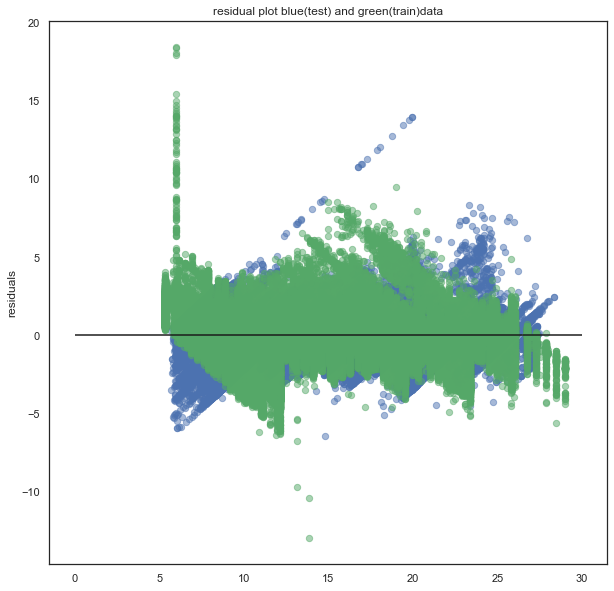

In [527]:
predtest= model.predict(X_valid)
mapeTest=np.mean(np.abs((y_valid-predtest) / y_valid)) * 100
predtrain= model.predict(X_train)
mapeTrain=np.mean(np.abs((y_train-predtrain) / y_train)) * 100

print("Test Mape :"+str(mapeTest))
print("Train Mape :"+str(mapeTrain))
plt.figure(figsize = (10,10))
plt.scatter(predtest,predtest-y_valid,c='b',s=40,alpha=0.5)
plt.scatter(y_train,predtrain - y_train,c='g',s=40,alpha=0.5)
plt.hlines(y=0,xmin=0,xmax=30)
plt.title('residual plot blue(test) and green(train)data')
plt.ylabel('residuals')

#### Hyperparameter Tuning with GRIDsearchCV
basically the same idea but my system will crush when I run those two cells between, so I skipped the results.

In [530]:
from keras.models import Sequential
from keras.layers import Activation, Dense,Dropout
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold
from math import fabs
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import GridSearchCV

cvscoresTest =[]
cvscoresTrain=[]
def baseline_model(optimizer='adam'):
    model = Sequential()
    model.add(Dense(50, input_dim=14, activation= "relu"))
    model.add(Dense(25, activation= "relu"))
    model.add(Dense(1, activation= "relu"))
    model.compile(loss= "mse" , optimizer=optimizer, metrics=["accuracy"])
    return model

estimatorF = KerasRegressor(build_fn=baseline_model, nb_epoch=100, batch_size=5, verbose=0)
optimizers = ['rmsprop', 'adam','SGD']

batch_size = [10, 20, 50]
epochs = [5, 10, 15]
param_grid = dict(optimizer=optimizers,batch_size=batch_size, epochs=epochs)
grid = GridSearchCV(estimator=estimatorF,param_grid=param_grid)
grid_result = grid.fit(X_train, y_train)

'"from keras.models import Sequential\nfrom keras.layers import Activation, Dense,Dropout\nfrom sklearn.model_selection import StratifiedKFold\nfrom sklearn.metrics import mean_squared_error\nfrom sklearn.model_selection import KFold\nfrom math import fabs\nfrom keras.wrappers.scikit_learn import KerasRegressor\nfrom sklearn.model_selection import GridSearchCV\n\ncvscoresTest =[]\ncvscoresTrain=[]\ndef baseline_model(optimizer=\'adam\'):\n    model = Sequential()\n    model.add(Dense(50, input_dim=14, activation= "relu"))\n    model.add(Dense(25, activation= "relu"))\n    model.add(Dense(1, activation= "relu"))\n    model.compile(loss= "mse" , optimizer=optimizer, metrics=["accuracy"])\n    return model\n\nestimatorF = KerasRegressor(build_fn=baseline_model, nb_epoch=100, batch_size=5, verbose=0)\noptimizers = [\'rmsprop\', \'adam\',\'SGD\']\n\nbatch_size = [10, 20, 50]\nepochs = [5, 10, 15]\nparam_grid = dict(optimizer=optimizers,batch_size=batch_size, epochs=epochs)\ngrid = GridSearc

In [ ]:
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

### -AutoSkLearn

Regressor by AutoSklearn when provided with the input of lending club dataset to get the outcome of Interest rate it ran across to predict the best model and provided the following outcome :
No models are better than Random Model.

In [13]:
!conda install swig --yes
!pip install  pyrfr 
!pip install auto-sklearn

Solving environment: done

# All requested packages already installed.



In [65]:
#Import Required File Into DataFrame and Compute in missing values
import pandas as pd
import numpy as np
selected_features = ['grade_C','grade_D','grade_E',
                    'grade_F','grade_G','grade_B',
                     'sub_grade_B5','sub_grade_B4',
                     'total_rec_int','sub_grade_E5',
                     'sub_grade_A5','sub_grade_C5',
                     'total_pymnt_inv','int_rate']
df=pd.read_csv("data_after_mice.csv",header=0,encoding='utf-8')

fullData = df[selected_features]

target_col = ["int_rate"]
cat_cols= []
num_cols= list(set(list(fullData.columns))-set(cat_cols)-set(target_col))
num_cat_cols = num_cols+cat_cols
for var in num_cat_cols:
    if fullData[var].isnull().any()==True:
        fullData[var+'_NA']=fullData[var].isnull()*1
#Impute numerical missing values with mean
fullData[num_cols] = fullData[num_cols].fillna(fullData[num_cols].mean())
#Impute categorical missing values with -9999
fullData[cat_cols] = fullData[cat_cols].fillna(value = -9999)
for var in cat_cols:
    number = LabelEncoder()
    fullData[var] = number.fit_transform(fullData[var].astype('str'))

features = list(set(list(fullData.columns))-set(target_col))
print(fullData[features].max())

fullData[features] = fullData[features]/fullData[features].max()


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


grade_B                1.00
grade_C                1.00
grade_F                1.00
sub_grade_C5           1.00
sub_grade_B5           1.00
grade_D                1.00
sub_grade_B4           1.00
total_rec_int      24205.62
grade_E                1.00
grade_G                1.00
sub_grade_A5           1.00
total_pymnt_inv    57777.58
sub_grade_E5           1.00
dtype: float64


In [15]:
#Run SKLearn
from sklearn.model_selection import train_test_split
import autosklearn.regression
import sklearn.model_selection
import sklearn.datasets
import sklearn.metrics
X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(fullData[features], fullData[target_col],test_size=0.20, random_state=42)
automl = autosklearn.regression.AutoSklearnRegressor()
automl.fit(X_train, y_train)

print(automl.show_models())
predictions = automl.predict(X_test)
print("R2 score:", sklearn.metrics.r2_score(y_test, predictions))
automl.fit(X_train, y_train)
y_hat_test = automl.predict(X_test)
x_hat_train=automl.predict(X_train)

Possible set intersection at position 3


[(0.940000, SimpleRegressionPipeline({'data_preprocessing:categorical_transformer:categorical_encoding:__choice__': 'no_encoding', 'data_preprocessing:categorical_transformer:category_coalescence:__choice__': 'no_coalescense', 'data_preprocessing:numerical_transformer:imputation:strategy': 'most_frequent', 'data_preprocessing:numerical_transformer:rescaling:__choice__': 'none', 'feature_preprocessor:__choice__': 'nystroem_sampler', 'regressor:__choice__': 'liblinear_svr', 'feature_preprocessor:nystroem_sampler:kernel': 'rbf', 'feature_preprocessor:nystroem_sampler:n_components': 305, 'regressor:liblinear_svr:C': 18080.177016227895, 'regressor:liblinear_svr:dual': 'False', 'regressor:liblinear_svr:epsilon': 0.0017155220175954669, 'regressor:liblinear_svr:fit_intercept': 'True', 'regressor:liblinear_svr:intercept_scaling': 1, 'regressor:liblinear_svr:loss': 'squared_epsilon_insensitive', 'regressor:liblinear_svr:tol': 7.035440846539455e-05, 'feature_preprocessor:nystroem_sampler:gamma': 

In [17]:
#!pip install aif360

     |████████████████████████████████| 165 kB 5.1 MB/s eta 0:00:01


### -H2o

Auto ML – Distributed Random Forest

Distributed Random Forest (DRF) is a powerful classification and regression tool. When given a set of data, DRF generates a forest of classification or regression trees, rather than a single classification or regression tree. Each of these trees is a weak learner built on a subset of rows and columns. More trees will reduce the variance. Both classification and regression take the average prediction over all of their trees to make a final prediction, whether predicting for a class or numeric value.

Significance of parameters used :

1. max_depth : max_depth: Specify the maximum tree depth. Higher values will make the model more complex and can lead to overfitting. Setting this value to 0 specifies no limit. This value defaults to 20.
2. ntrees : ntrees: Specify the number of trees.
3. Stopping_rounds : stopping options are used to increase performance by restricting the number of models that get built. The model will stop if the ratio between the best moving average and reference moving average is more or equal 1-1e-3 (the misclassification is the less the better metric, for the more the better metrics the ratio have to be less or equal 1+1e-3 to stop).
4. Seed : Specify the random number generator (RNG) seed for algorithm components dependent on randomization. The seed is consistent for each H2O instance so that you can create models with the same starting conditions in alternative configurations.
5. score_each_iteration : score_each_iteration: (Optional) Enable this option to score during each iteration of the model training.

In [531]:
df2=pd.read_csv('non_normalized_data.csv')
df1=pd.read_csv('normalized.csv')
result = pd.concat([df1, df2], axis=1)
df = pd.concat([df1, df2], axis=1)
df.drop(['Unnamed: 0'],axis=1,inplace=True)

In [550]:
df.to_csv('after_normalized')

In [545]:
import sys
import h2o
from h2o.estimators.random_forest import H2ORandomForestEstimator
from h2o.estimators.glm import H2OGeneralizedLinearEstimator
from h2o.grid.grid_search import H2OGridSearch
from h2o.estimators.deeplearning import H2ODeepLearningEstimator
import numpy as np

In [546]:
def MAPE(test, predict):
    mape = 0

    for i, j in zip(test['int_rate'].as_data_frame().values, predict.as_data_frame().values):
        mape += np.abs((i-j)/i)

    mape = (mape/test.shape[0])*100

    return mape

In [547]:
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321 . connected.


H2O_cluster_uptime:,1 day 10 hours 21 mins
H2O_cluster_timezone:,America/New_York
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.32.0.2
H2O_cluster_version_age:,25 days
H2O_cluster_name:,H2O_from_python_jinqimeng_luqvtu
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,1.434 Gb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"locked, healthy"


In [552]:
df_linear = h2o.import_file('after_normalized')
df_linear.head()

Parse progress: |█████████████████████████████████████████████████████████| 100%


C1,loan_amnt,funded_amnt,funded_amnt_inv,term,installment,emp_length,annual_inc,issue_month,issue_year,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,total_rev_hi_lim,application_type_JOINT,grade_B,grade_C,grade_D,grade_E,grade_F,grade_G,sub_grade_A2,sub_grade_A3,sub_grade_A4,sub_grade_A5,sub_grade_B1,sub_grade_B2,sub_grade_B3,sub_grade_B4,sub_grade_B5,sub_grade_C1,sub_grade_C2,sub_grade_C3,sub_grade_C4,sub_grade_C5,sub_grade_D1,sub_grade_D2,sub_grade_D3,sub_grade_D4,sub_grade_D5,sub_grade_E1,sub_grade_E2,sub_grade_E3,sub_grade_E4,sub_grade_E5,sub_grade_F1,sub_grade_F2,sub_grade_F3,sub_grade_F4,sub_grade_F5,sub_grade_G1,sub_grade_G2,sub_grade_G3,sub_grade_G4,sub_grade_G5,home_ownership_MORTGAGE,home_ownership_NONE,home_ownership_OTHER,home_ownership_OWN,home_ownership_RENT,verification_status_Verified,loan_status_Current,loan_status_Default,loan_status_Issued,pymnt_plan_y,initial_list_status_w,int_rate
0,0.0341695,0.0341695,0.0339986,0.00024602,0.00111304,6.8339e-05,0.164013,8.20067e-05,0.013743,0.000188957,0,6.8339e-06,2.05017e-05,0,0.093269,0.000571997,6.15051e-05,0,0,0.0400539,0.0398538,0.0341695,0.00588446,0,0,0,0.00117283,0,0,0.00154446,0.953041,0.219163,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,10.65
1,0.0170876,0.0170876,0.0170876,0.000341752,0.00040894,0,0.205051,8.20204e-05,0.0137453,6.83503e-06,0,3.41752e-05,2.05051e-05,0,0.0115307,6.42493e-05,2.73401e-05,0,0,0.00689457,0.00689457,0.00311992,0.0029744,0,0.000800246,7.58689e-06,0.00081788,0,0,0.00154472,0.9532,0.219199,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,15.27
2,0.0166885,0.0166885,0.0166885,0.000250327,0.000586391,6.95353e-05,0.0851946,8.34424e-05,0.0139835,6.06348e-05,0,1.39071e-05,1.39071e-05,0,0.0205546,0.000684923,6.95353e-05,0,0,0.020886,0.020886,0.0166885,0.0041975,0,0,0,0.00451917,0,0,0.0015715,0.969725,0.223,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,15.96
3,0.0650432,0.0650432,0.0650432,0.000234156,0.00220698,6.50432e-05,0.320013,7.80519e-05,0.0130802,0.000130086,0,6.50432e-06,6.50432e-05,0,0.0364112,0.000136591,0.00024066,0,0,0.0795238,0.0795238,0.0650432,0.0143702,0.000110378,0,0,0.00232517,0,0,0.00146998,0.90708,0.208594,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,13.49
4,0.0180226,0.0180226,0.0180226,0.000300376,0.00040725,6.00753e-06,0.480602,7.20903e-05,0.0120811,0.000107775,0,0,9.01129e-05,0,0.166907,0.000323806,0.000228286,0.00460717,0.00460717,0.0194774,0.0194774,0.0134154,0.00606201,0,0,0,0.00040725,0,0,0.0013577,0.837797,0.192661,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,12.69
5,0.0337066,0.0337066,0.0337066,0.000242688,0.00105475,2.0224e-05,0.242688,8.08959e-05,0.0135568,7.55028e-05,0,2.0224e-05,6.06719e-05,0,0.0536812,0.000190779,8.08959e-05,0,0,0.0379629,0.037963,0.0337066,0.00425634,0,0,0,0.00108556,0,0,0.00152354,0.940132,0.216194,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,7.9
6,0.0458324,0.0458324,0.0458324,0.000327374,0.0011136,5.23799e-05,0.307758,7.85698e-05,0.013167,0.000153931,0,6.54748e-06,4.58324e-05,0,0.116061,0.000560464,7.20223e-05,0.0123692,0.0123692,0.0532758,0.0532758,0.0334632,0.0198126,0,0,0,0.0011136,0,0,0.00147973,0.913099,0.209978,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,15.96
7,0.0198156,0.0198156,0.0198156,0.000237788,0.000722808,5.94469e-05,0.31705,7.92625e-05,0.0132831,3.53379e-05,0,1.32104e-05,2.64208e-05,0,0.0543014,0.000577956,2.64208e-05,0,0

In [553]:
df = h2o.import_file('data_after_mice.csv')
df

Parse progress: |█████████████████████████████████████████████████████████| 100%


C1,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,emp_length,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,total_rev_hi_lim,issue_month,issue_year,grade_B,grade_C,grade_D,grade_E,grade_F,grade_G,sub_grade_A2,sub_grade_A3,sub_grade_A4,sub_grade_A5,sub_grade_B1,sub_grade_B2,sub_grade_B3,sub_grade_B4,sub_grade_B5,sub_grade_C1,sub_grade_C2,sub_grade_C3,sub_grade_C4,sub_grade_C5,sub_grade_D1,sub_grade_D2,sub_grade_D3,sub_grade_D4,sub_grade_D5,sub_grade_E1,sub_grade_E2,sub_grade_E3,sub_grade_E4,sub_grade_E5,sub_grade_F1,sub_grade_F2,sub_grade_F3,sub_grade_F4,sub_grade_F5,sub_grade_G1,sub_grade_G2,sub_grade_G3,sub_grade_G4,sub_grade_G5,home_ownership_MORTGAGE,home_ownership_NONE,home_ownership_OTHER,home_ownership_OWN,home_ownership_RENT,verification_status_Source Verified,verification_status_Verified,loan_status_Current,loan_status_Default,loan_status_Does not meet the credit policy. Status:Charged Off,loan_status_Does not meet the credit policy. Status:Fully Paid,loan_status_Fully Paid,loan_status_In Grace Period,loan_status_Issued,loan_status_Late (16-30 days),loan_status_Late (31-120 days),pymnt_plan_y,initial_list_status_w,application_type_JOINT
0,5000,5000,4975,36,10.65,162.87,10,24000,27.65,0,1,3,0,13648,83.7,9,0,0,5861.07,5831.78,5000,861.07,0,0,0,171.62,0,0,226,139458,32070,12,2011,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0
1,2500,2500,2500,50,15.27,59.83,0,30000,1,0,5,3,0,1687,9.4,4,0,0,1008.71,1008.71,456.46,435.17,0,117.08,1.11,119.66,0,0,226,139458,32070,12,2011,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2400,2400,2400,36,15.96,84.33,10,12252,8.72,0,2,2,0,2956,98.5,10,0,0,3003.65,3003.65,2400,603.65,0,0,0,649.91,0,0,226,139458,32070,12,2011,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3,10000,10000,10000,36,13.49,339.31,10,49200,20,0,1,10,0,5598,21,37,0,0,12226.3,12226.3,10000,2209.33,16.97,0,0,357.48,0,0,226,139458,32070,12,2011,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0
4,3000,3000,3000,50,12.69,67.79,1,80000,17.94,0,0,15,0,27783,53.9,38,766.9,766.9,3242.17,3242.17,2233.1,1009.07,0,0,0,67.79,0,0,226,139458,32070,12,2011,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0
5,5000,5000,5000,36,7.9,156.46,3,36000,11.2,0,3,9,0,7963,28.3,12,0,0,5631.38,5631.38,5000,631.38,0,0,0,161.03,0,0,226,139458,32070,12,2011,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0
6,7000,7000,7000,50,15.96,170.08,8,47004,23.51,0,1,7,0,17726,85.6,11,1889.15,1889.15,8136.84,8136.84,5110.85,3025.99,0,0,0,170.08,0,0,226,139458,32070,12,2011,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0
7,3000,3000,3000,36,18.64,109.43,9,48000,5.35,0,2,4,0,8221,87.5,4,0,0,3938.14,3938.14,3000,938.14,0,0,0,111.34,0,0,226,139458,32070,12,2011,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0
8,5600,5600,5600,50,21.28,152.39,4,40000,5.55,0,2,11,0,5210,32.6,13,0,0,646.02,646.02,162.02,294.94,0,189.06,2.09,152.39,0,0,226,139458,32070,12,2011,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
9,5375,5375,5350,50,12.69,121.45,0,15000,18.08,0,0,2,0,9279,36.5,3,0,0,1476.19,1469.34,673.48,533.42,0,269.29,2.52,121.45,0,0,226,139458,32070,12,2011,1,0,0,0,0,0,0,0,0,0,0,0,0,0

In [556]:
train, valid, test = df.split_frame(
    ratios=[0.6,0.2], 
    seed=1234, 
    destination_frames=['train.hex','valid.hex','test.hex']
)

In [557]:
train_linear, valid_linear, test_linear = df_linear.split_frame(
    ratios=[0.6,0.2], 
    seed=1234, 
    destination_frames=['train.hex','valid.hex','test.hex']
)

In [558]:
df.columns

['C1',
 'loan_amnt',
 'funded_amnt',
 'funded_amnt_inv',
 'term',
 'int_rate',
 'installment',
 'emp_length',
 'annual_inc',
 'dti',
 'delinq_2yrs',
 'inq_last_6mths',
 'open_acc',
 'pub_rec',
 'revol_bal',
 'revol_util',
 'total_acc',
 'out_prncp',
 'out_prncp_inv',
 'total_pymnt',
 'total_pymnt_inv',
 'total_rec_prncp',
 'total_rec_int',
 'total_rec_late_fee',
 'recoveries',
 'collection_recovery_fee',
 'last_pymnt_amnt',
 'collections_12_mths_ex_med',
 'acc_now_delinq',
 'tot_coll_amt',
 'tot_cur_bal',
 'total_rev_hi_lim',
 'issue_month',
 'issue_year',
 'grade_B',
 'grade_C',
 'grade_D',
 'grade_E',
 'grade_F',
 'grade_G',
 'sub_grade_A2',
 'sub_grade_A3',
 'sub_grade_A4',
 'sub_grade_A5',
 'sub_grade_B1',
 'sub_grade_B2',
 'sub_grade_B3',
 'sub_grade_B4',
 'sub_grade_B5',
 'sub_grade_C1',
 'sub_grade_C2',
 'sub_grade_C3',
 'sub_grade_C4',
 'sub_grade_C5',
 'sub_grade_D1',
 'sub_grade_D2',
 'sub_grade_D3',
 'sub_grade_D4',
 'sub_grade_D5',
 'sub_grade_E1',
 'sub_grade_E2',
 'sub_gr

In [559]:
# predictors = [i for i in df.columns if 'grade' in i]
# predictors.append('loan_status_Does_not_meet_the_credit_policy_Status_Charged_Off')
# predictors.append('loan_status_Does_not_meet_the_credit_policy_Status_Fully_Paid')
# predictors.append('inq_last_6mths')
# predictors

predictors = ['grade_C','grade_D','grade_E',
        'grade_F','grade_G','total_rec_int',
        'total_pymnt_inv','funded_amnt_inv','sub_grade_B5',
        'sub_grade_C5','sub_grade_C4','sub_grade_C3','sub_grade_B4','sub_grade_D5']

predictors

['grade_C',
 'grade_D',
 'grade_E',
 'grade_F',
 'grade_G',
 'total_rec_int',
 'total_pymnt_inv',
 'funded_amnt_inv',
 'sub_grade_B5',
 'sub_grade_C5',
 'sub_grade_C4',
 'sub_grade_C3',
 'sub_grade_B4',
 'sub_grade_D5']

In [560]:
response = 'int_rate'

In [561]:
rf = H2ORandomForestEstimator(ntrees = 20, max_depth = 60, stopping_rounds = 2, 
                             score_each_iteration = True, seed = 1000000)
rf.train(x = predictors, y = response, training_frame = train, validation_frame = valid)
rf

drf Model Build progress: |███████████████████████████████████████████████| 100%
Model Details
H2ORandomForestEstimator :  Distributed Random Forest
Model Key:  DRF_model_python_1607723085760_1


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,20.0,20.0,36513715.0,55.0,60.0,58.6,122493.0,156653.0,145522.0




ModelMetricsRegression: drf
** Reported on train data. **

MSE: 0.7268362703666192
RMSE: 0.8525469314745197
MAE: 0.4642904140642384
RMSLE: 0.071334641029444
Mean Residual Deviance: 0.7268362703666192

ModelMetricsRegression: drf
** Reported on validation data. **

MSE: 0.6609541973912304
RMSE: 0.8129908962535991
MAE: 0.4440585467018429
RMSLE: 0.06793236662186604
Mean Residual Deviance: 0.6609541973912304

Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance,validation_rmse,validation_mae,validation_deviance
0,,2020-12-13 11:07:50,0.063 sec,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1,,2020-12-13 11:07:53,3.316 sec,1.0,1.084844,0.537412,1.176886,1.070947,0.532441,1.146928
2,,2020-12-13 11:07:55,5.352 sec,2.0,1.061393,0.556236,1.126556,0.947956,0.515711,0.898620
3,,2020-12-13 11:07:58,8.021 sec,3.0,1.031981,0.538147,1.064984,0.897472,0.488116,0.805457
4,,2020-12-13 11:08:00,10.150 sec,4.0,1.006276,0.524880,1.012591,0.872751,0.474071,0.761694
5,,2020-12-13 11:08:02,12.484 sec,5.0,0.983902,0.513975,0.968064,0.858329,0.464967,0.736728
6,,2020-12-13 11:08:04,14.509 sec,6.0,0.962340,0.505547,0.926098,0.847707,0.459653,0.718607
7,,2020-12-13 11:08:06,16.561 sec,7.0,0.945657,0.499280,0.894268,0.839282,0.455885,0.704394
8,,2020-12-13 11:08:09,18.906 sec,8.0,0.929986,0.492097,0.864875,0.833331,0.451534,0.694440
9,,2020-12-13 11:08:11,20.912 sec,9.0,0.917981,0.491933,0.842688,0.829780,0.454208,0.688536



See the whole table with table.as_data_frame()

Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,grade_E,3.453773e+07,1.000000,0.245795
1,grade_D,2.494566e+07,0.722273,0.177531
2,grade_F,2.362530e+07,0.684043,0.168134
3,total_rec_int,1.642600e+07,0.475596,0.116899
4,grade_C,1.421344e+07,0.411534,0.101153
5,grade_G,8.451564e+06,0.244705,0.060147
6,total_pymnt_inv,4.362412e+06,0.126309,0.031046
7,funded_amnt_inv,3.432685e+06,0.099389,0.024429
8,sub_grade_B5,2.942843e+06,0.085207,0.020943
9,sub_grade_B4,2.807082e+06,0.081276,0.019977


In [562]:
test_predict = rf.predict(test)
test_predict

drf prediction progress: |████████████████████████████████████████████████| 100%


predict
13.7695
12.028
10.1175
7.504
11.71
8.449
14.8665
12.505
12.5685
11.0985


In [563]:
mape = 0

for i, j in zip(test['int_rate'].as_data_frame().values, test_predict.as_data_frame().values):
    mape += np.abs((i-j)/i)
    
mape = (mape/test.shape[0])*100

mape

array([3.802])

#### General linear regression

Parameters used for GLM in h2o 

1. Family :  Gaussian
family: Specify the model type.If the family is gaussian, the data must be numeric (Real or Int).Since we had converted all the categorical data to numerical data we use Gaussian family for linear regression.

2. Lambda_search : True
lambda_search: Lambda is the regularization strength. Specify whether to enable lambda search, starting with lambda max (the smallest λλ that drives all coefficients to zero). We can always put in the lambda manually but since GLM automatically uses the best value of lambda and uses the same for further analysis we used lambda_search.

In [564]:
glm = H2OGeneralizedLinearEstimator(family = 'gaussian', lambda_search = True)
glm.train(x = predictors, y = response, training_frame = train_linear, validation_frame = valid_linear)
glm

glm Model Build progress: |███████████████████████████████████████████████| 100%
Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_model_python_1607723085760_2


GLM Model: summary


,,family,link,regularization,lambda_search,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
0,,gaussian,identity,"Elastic Net (alpha = 0.5, lambda = 0.002678 )","nlambda = 100, lambda.max = 4.1663, lambda.min = 0.002678, lambda....",14,14,80,train.hex




ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 1.513639614355923
RMSE: 1.2303006195056243
MAE: 0.9126910753403611
RMSLE: 0.11050056718097724
R^2: 0.921277214468968
Mean Residual Deviance: 1.513639614355923
Null degrees of freedom: 532788
Residual degrees of freedom: 532774
Null deviance: 10244181.923362404
Residual deviance: 806450.5364930779
AIC: 1732871.8308642635

ModelMetricsRegressionGLM: glm
** Reported on validation data. **

MSE: 1.5092179936961734
RMSE: 1.2285023376844562
MAE: 0.9105598602002839
RMSLE: 0.1100814398433332
R^2: 0.9210672241146647
Mean Residual Deviance: 1.5092179936961734
Null degrees of freedom: 177474
Residual degrees of freedom: 177460
Null deviance: 3393375.739961375
Residual deviance: 267848.46343122836
AIC: 576731.4571984953

Scoring History: 


,,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test,training_rmse,training_deviance,training_mae,training_r2,validation_rmse,validation_deviance,validation_mae,validation_r2
0,,2020-12-13 11:09:30,0.000 sec,1,.42E1,1,19.227465,19.120303,,,,,,,,
1,,2020-12-13 11:09:31,0.143 sec,2,.38E1,3,18.906124,18.798788,,,,,,,,
2,,2020-12-13 11:09:31,0.247 sec,3,.35E1,3,18.441083,18.334209,,,,,,,,
3,,2020-12-13 11:09:31,0.269 sec,4,.32E1,5,17.731406,17.625523,,,,,,,,
4,,2020-12-13 11:09:31,0.288 sec,5,.29E1,5,16.916153,16.811699,,,,,,,,
5,,2020-12-13 11:09:31,0.309 sec,6,.26E1,5,16.123983,16.021054,,,,,,,,
6,,2020-12-13 11:09:31,0.328 sec,7,.24E1,5,15.358828,15.257514,,,,,,,,
7,,2020-12-13 11:09:31,0.345 sec,8,.22E1,5,14.624275,14.524655,,,,,,,,
8,,2020-12-13 11:09:31,0.422 sec,9,.2E1,5,13.923313,13.825458,,,,,,,,
9,,2020-12-13 11:09:31,0.438 sec,10,.18E1,6,13.201287,13.107499,,,,,,,,



See the whole table with table.as_data_frame()

Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,grade_E,2.947839,1.000000,0.195446
1,grade_D,2.924191,0.991978,0.193878
2,grade_F,2.279753,0.773364,0.151151
3,grade_C,1.958423,0.664359,0.129846
4,grade_G,1.279400,0.434013,0.084826
5,sub_grade_B5,0.798445,0.270858,0.052938
6,sub_grade_B4,0.716610,0.243097,0.047512
7,sub_grade_C5,0.435556,0.147754,0.028878
8,total_rec_int,0.385277,0.130698,0.025544
9,total_pymnt_inv,0.357381,0.121235,0.023695


In [565]:
test_predict = glm.predict(test)
test_predict

glm prediction progress: |████████████████████████████████████████████████| 100%


predict
13.5339
12.0714
8.79649
8.63606
8.85729
8.73362
16.0235
11.9873
12.7165
9.03468


In [566]:
MAPE(test, test_predict)

array([8.537])

#### Neural network

Auto ML – Deep Neural Network
H2O’s Deep Learning is based on a multi-layer feedforward artificial neural network that is trained with stochastic gradient descent using back-propagation. The network can contain a large number of hidden layers consisting of neurons with tanh, rectifier, and maxout activation functions. Advanced features such as adaptive learning rate, rate annealing, momentum training, dropout, L1 or L2 regularization, checkpointing, and grid search enable high predictive accuracy. Each compute node trains a copy of the global model parameters on its local data with multi-threading (asynchronously) and contributes periodically to the global model via model averaging across the network.

Significance of parameters used :
1. epochs : Specify the number of times to iterate (stream) the dataset. The value can be a fraction.
2. hidden: Specify the hidden layer sizes (e.g., 100,100). The value must be positive.
3. mini_batch_size: Specify a value for the mini-batch size. (Smaller values lead to a better fit; larger values can speed up and generalize better.)
4. activation: Specify the activation function (Tanh, Tanh with dropout, Rectifier, Rectifier with dropout, Maxout, Maxout with dropout).We used RELU (Rectified Linear Unit.).

In [567]:
batch_size = [10, 20, 40, 60, 80, 100]
epochs = [10, 50, 100]

In [568]:
results = []

for ep in epochs:
    for batch in batch_size:
        print('epoch: {}, batch: {}'.format(ep, batch))
        dl = H2ODeepLearningEstimator(hidden = [50, 25], activation = 'Tanh', 
                              distribution = 'gaussian', mini_batch_size = batch, epochs = ep)
        dl.train(x = predictors, y = response, training_frame = train, validation_frame = valid)
        
        test_predict = dl.predict(test)
        
        mape = MAPE(test, test_predict)
        
        results.append('epoch: {}, batch: {}, MAPE: {}'.format(ep, batch, mape))

epoch: 10, batch: 10
deeplearning Model Build progress: |██████████████████████████████████████| 100%
deeplearning prediction progress: |███████████████████████████████████████| 100%
epoch: 10, batch: 20
deeplearning Model Build progress: |██████████████████████████████████████| 100%
deeplearning prediction progress: |███████████████████████████████████████| 100%
epoch: 10, batch: 40
deeplearning Model Build progress: |██████████████████████████████████████| 100%
deeplearning prediction progress: |███████████████████████████████████████| 100%
epoch: 10, batch: 60
deeplearning Model Build progress: |██████████████████████████████████████| 100%
deeplearning prediction progress: |███████████████████████████████████████| 100%
epoch: 10, batch: 80
deeplearning Model Build progress: |██████████████████████████████████████| 100%
deeplearning prediction progress: |███████████████████████████████████████| 100%
epoch: 10, batch: 100
deeplearning Model Build progress: |███████████████████████████

In [569]:
results

['epoch: 10, batch: 10, MAPE: [5.684]',
 'epoch: 10, batch: 20, MAPE: [5.278]',
 'epoch: 10, batch: 40, MAPE: [5.453]',
 'epoch: 10, batch: 60, MAPE: [5.277]',
 'epoch: 10, batch: 80, MAPE: [5.078]',
 'epoch: 10, batch: 100, MAPE: [5.265]',
 'epoch: 50, batch: 10, MAPE: [5.459]',
 'epoch: 50, batch: 20, MAPE: [5.85]',
 'epoch: 50, batch: 40, MAPE: [5.403]',
 'epoch: 50, batch: 60, MAPE: [4.755]',
 'epoch: 50, batch: 80, MAPE: [5.362]',
 'epoch: 50, batch: 100, MAPE: [5.544]',
 'epoch: 100, batch: 10, MAPE: [5.315]',
 'epoch: 100, batch: 20, MAPE: [5.284]',
 'epoch: 100, batch: 40, MAPE: [5.308]',
 'epoch: 100, batch: 60, MAPE: [4.915]',
 'epoch: 100, batch: 80, MAPE: [5.157]',
 'epoch: 100, batch: 100, MAPE: [5.364]']

##### **Interpretations after comparing MAPE observed from neural network and Deep Neural Network(h2o)**

1. Interpretability : We observed that MAPE observed from distributed random forest regression and Auto ML h2o GLM differ from each other by  . So it can be clearly deduced that the two methods aren’t very different from each other and its safe to say that these two methods can be used interchangeably.
2. Reproducibility : Since reproducibility is defined by seed specified by  the random number generator (RNG) seed for algorithm components dependent on randomization. Neural Network’s cost function’s is non convex and so solutions can get stuck in a local optima and there are multiple local optima. Also this depends on how you initialize the weights.


### -Tpot

TPOT is meant to be an assistant that gives you ideas on how to solve a particular machine learning problem by exploring pipeline configurations that you might have never considered, then leaves the fine-tuning to more constrained parameter tuning techniques such as grid 
![tpot](https://raw.githubusercontent.com/EpistasisLab/tpot/master/images/tpot-ml-pipeline.png)

TPOT has what its developers call a genetic search algorithm to find the best parameters and model ensembles. It could also be thought of as a natural selection or evolutionary algorithm. TPOT tries a pipeline, evaluates its performance, and randomly changes parts of the pipeline in search of better performing algorithms.

In [13]:
data = pd.read_csv('after_normalized')
data.drop(['Unnamed: 0'],axis=1,inplace=True)
data.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,installment,emp_length,annual_inc,issue_month,issue_year,dti,...,home_ownership_OTHER,home_ownership_OWN,home_ownership_RENT,verification_status_Verified,loan_status_Current,loan_status_Default,loan_status_Issued,pymnt_plan_y,initial_list_status_w,int_rate
0,0.034169,0.034169,0.033999,0.000246,0.001113,0.000068,0.164013,0.000082,0.013743,0.000189,...,0,0,1,1,0,0,0,0,0,10.65
1,0.017088,0.017088,0.017088,0.000342,0.000409,0.000000,0.205051,0.000082,0.013745,0.000007,...,0,0,1,0,0,0,0,0,0,15.27
2,0.016688,0.016688,0.016688,0.000250,0.000586,0.000070,0.085195,0.000083,0.013984,0.000061,...,0,0,1,0,0,0,0,0,0,15.96
3,0.065043,0.065043,0.065043,0.000234,0.002207,0.000065,0.320013,0.000078,0.013080,0.000130,...,0,0,1,0,0,0,0,0,0,13.49
4,0.018023,0.018023,0.018023,0.000300,0.000407,0.000006,0.480602,0.000072,0.012081,0.000108,...,0,0,1,0,1,0,0,0,0,12.69


In [14]:
predictors = ['grade_C','grade_D','grade_E',
        'grade_F','grade_G','total_rec_int',
        'total_pymnt_inv','funded_amnt_inv','sub_grade_B5',
        'sub_grade_C5','sub_grade_C4','sub_grade_C3','sub_grade_B4','sub_grade_D5']

predictors

['grade_C',
 'grade_D',
 'grade_E',
 'grade_F',
 'grade_G',
 'total_rec_int',
 'total_pymnt_inv',
 'funded_amnt_inv',
 'sub_grade_B5',
 'sub_grade_C5',
 'sub_grade_C4',
 'sub_grade_C3',
 'sub_grade_B4',
 'sub_grade_D5']

In [15]:
response = ['int_rate']

In [16]:
X_train, X_test, y_train, y_test = train_test_split(data[predictors], data[response],
                                                    train_size=0.6, test_size=0.4)


X_train = X_train.values
X_test = X_test.values
y_train = y_train.values.ravel()
y_test = y_test.values.ravel()

In [18]:
tpot_config = {'sklearn.tree.DecisionTreeClassifier': {},
              'sklearn.neural_network.MLPClassifier': {'hidden_layer_sizes': [50, 25], 
                                                       'activation': ['relu', 'tanh', 'logistic', 'identity'],
                                                      'batch_size': [10, 20, 40, 60, 80, 100], 
                                                       'solver': ['adam', 'sgd', 'lbfgs'], 'max_iter': [10, 50, 100],
                                                      'batch_size': [10, 20, 40, 60, 80, 100]},
              'sklearn.linear_model.LinearRegression': {}}

In [20]:
tpot = TPOTRegressor(generations=5, population_size=50, verbosity=2, config_dict = tpot_config)
tpot.fit(X_train, y_train)
print(tpot.score(X_test, y_test))
#tpot.export('tpot_lendingClub_pipeline_lite.py')


Generation 1 - Current best internal CV score: -1.5122852084624125

Generation 2 - Current best internal CV score: -1.512274597825913

Generation 3 - Current best internal CV score: -1.512274597825913

Generation 4 - Current best internal CV score: -1.5122740245043702

Generation 5 - Current best internal CV score: -1.5122740245043702

Best pipeline: LinearRegression(LinearRegression(LinearRegression(CombineDFs(LinearRegression(input_matrix), input_matrix))))
-1.5134932244564976


In [21]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline, make_union
from tpot.builtins import StackingEstimator
from sklearn.preprocessing import FunctionTransformer
from copy import copy

In [22]:
X_train, X_test, y_train, y_test = train_test_split(data[predictors], data[response],
                                                    train_size=0.6, test_size=0.4)


X_train = X_train.values
X_test = X_test.values
y_train = y_train.values.ravel()
y_test = y_test.values.ravel()

In [23]:
# Average CV score on the training set was:-1.5233027505419723
exported_pipeline = make_pipeline(
    make_union(
        make_union(
            FunctionTransformer(copy),
            FunctionTransformer(copy)
        ),
        StackingEstimator(estimator=LinearRegression())
    ),
    LinearRegression()
)

In [24]:
exported_pipeline.fit(X_train, y_train)
results = exported_pipeline.predict(X_test)

In [25]:
mape = 0

for i,j in zip(y_test, results):
    mape += np.abs((i-j)/i)
mape = (mape*100)/y_test.shape[0]
mape

8.547534090813704

## Testing


We selected test cases based on 6 criteria :
1. Annual Income : 2 test cases for high annual income, low income, mid range annual income each
2. Term : Selected 5 case each for both of the given term i.e 36, 60 months
3. Loan amount : 5 cases for high loan amount, low amount, mid range loan amount each
4. Purpose :  Took a different case for each of the 10 purposes
5. State :  Selected a case for each of the 50 states
6. Enquiries in Last 6 months : Selected 2 test cases for lower number enquiries, 2 for  higher enquiries, and 2 for mid number of enquiries

In [588]:
import pandas as pd

dataset = pd.read_csv("test.csv",header=0,encoding='utf-8')
df = dataset.copy()
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
0,66415476,71141331,20000,20000,20000.0,36 months,16.99,712.96,D,D3,...,1554.0,51.8,1.0,1.0,3527.0,78.5,8100.0,1.0,0.0,1.0
1,65199509,69726237,3700,3700,3700.0,36 months,12.59,123.94,C,C2,...,NaN,NaN,NaN,NaN,NaN,NaN,18700.0,NaN,NaN,NaN
2,123688,123685,1800,1800,775.0,36 months,17.22,64.38,G,G3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,54067210,57607924,24000,24000,24000.0,60 months,7.89,485.38,A,A5,...,NaN,NaN,NaN,NaN,NaN,NaN,84200.0,NaN,NaN,NaN
4,60565847,64586591,10000,10000,9900.0,36 months,6.89,308.27,A,A3,...,NaN,NaN,NaN,NaN,NaN,NaN,15900.0,NaN,NaN,NaN


In [589]:
df = pd.get_dummies(df,columns=['grade','sub_grade','home_ownership',
                                'verification_status','loan_status','pymnt_plan'
                                ,'initial_list_status','application_type'],drop_first=True)
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,emp_title,emp_length,...,home_ownership_OWN,home_ownership_RENT,verification_status_Source Verified,verification_status_Verified,loan_status_Current,loan_status_Does not meet the credit policy. Status:Charged Off,loan_status_Does not meet the credit policy. Status:Fully Paid,loan_status_Fully Paid,initial_list_status_w,application_type_JOINT
0,66415476,71141331,20000,20000,20000.0,36 months,16.99,712.96,NaN,NaN,...,0,0,0,0,1,0,0,0,1,1
1,65199509,69726237,3700,3700,3700.0,36 months,12.59,123.94,NaN,NaN,...,0,0,0,0,1,0,0,0,0,1
2,123688,123685,1800,1800,775.0,36 months,17.22,64.38,"disabled, student",1 year,...,0,1,0,0,0,0,1,0,0,0
3,54067210,57607924,24000,24000,24000.0,60 months,7.89,485.38,reg nurse,10+ years,...,0,0,1,0,1,0,0,0,0,0
4,60565847,64586591,10000,10000,9900.0,36 months,6.89,308.27,Interim Director of Case Management,3 years,...,0,0,1,0,1,0,0,0,0,0


In [590]:
selected_features = ['grade_C','grade_D','grade_E',
                     'grade_F','grade_G','total_rec_int',
                     'total_pymnt_inv','funded_amnt_inv','sub_grade_B5',
                     'sub_grade_B4','sub_grade_C5','sub_grade_C4',
                     'sub_grade_C3','sub_grade_D5','int_rate']

features = df[selected_features]

In [591]:
# Converting Dataframes to Individual Arrays of Features and Labels to Fit to a Model
import numpy as np

# Labels are the values we want to predict
labels = np.array(features['int_rate'])

# Remove the labels from the features
# axis 1 refers to the columns
features= features.drop('int_rate', axis = 1)

# Saving feature names for later use
feature_list = list(features.columns)

# Convert to numpy array
features = np.array(features)

In [592]:
from sklearn.ensemble import RandomForestRegressor
rf_best = RandomForestRegressor(n_estimators= 20,
 min_samples_split=2,
 min_samples_leaf=2,
 max_features='auto',
 max_depth=60,
 bootstrap=True)

In [593]:
rf_best.fit(features,labels)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=60,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=2, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=20,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

In [594]:
predictions = rf_best.predict(features)
predictions

array([15.961, 13.409, 11.706,  9.828,  8.851, 15.306, 15.272, 15.225,
       13.294, 18.948, 12.171, 18.003, 11.794,  9.331, 11.647, 11.159,
       10.551,  9.79 , 16.848, 13.374,  9.438, 19.77 ,  9.789, 20.503,
       14.972, 19.483, 20.482, 13.221, 11.746,  9.087, 21.17 , 19.201,
        9.03 , 19.255, 18.634, 18.364, 21.161, 19.46 , 16.905,  8.478,
       14.943, 13.317, 19.852, 17.327, 17.355, 19.519, 21.107,  9.087,
        9.738, 18.758, 14.298, 13.844, 13.953, 18.108, 16.976, 15.193,
       18.202, 18.048, 11.458, 18.145, 17.651, 20.242,  9.067, 15.35 ,
       21.153, 20.307, 13.969, 16.522, 13.751, 15.035, 17.102, 13.609])

In [595]:
pred = pd.DataFrame(data = predictions,columns = ['predicted_int_rate'])

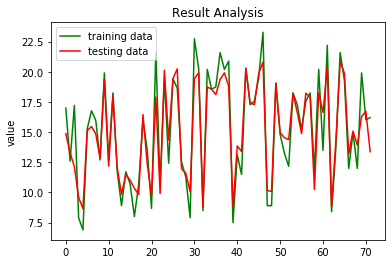

In [19]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

#开始画图
#sub_axix = filter(lambda x:x%200 == 0, x_axix)
plt.title('Result Analysis')
plt.plot(df['int_rate'], color='green',label='training data')
plt.plot(pred['predicted_int_rate'], color='red', label='testing data')
plt.legend() # 显示图例

plt.ylabel('value')
plt.show()

In [596]:
pred.to_csv("predictions.csv")

### Result & Conclusion

* MAPE obtained after linear regression: 8.50
* MAPE obtained after Generalized Linear Model(h20): 8.53
* MAPE obtained after Random Forest Regression: 3.60
* MAPE obtained after Distributed Random Forest Model(h20): 3.80
* MAPE obtained after Neural Network  Regression: 5.25 
* MAPE obtained after Neural Network Model(h20): 4.75
* MAPE obtained from TPOT: 8.54

*More detailed comperasion between evaluation metrics in Evaluation.pdf

Amongst all of the three models we can see that Random Forest regressor gives us the best predictions. Given, any test case including the ones carried out by our team, the predicted values can be seen satisfactory as compared to the actual data of interest rates provided by the lending club. So if we test, our model, against any scenario, be risk averse, risk taking or any other scenario, our model will give a satisfactory predicted estimate of the interest rate.

As we can see that based on the test case, the predicted interest rate line and the actual interest rate line provided by the model are closely aligned to each other providing the minimum error rate. Thus a client can be provided with a interest rate based on six criteria provided above

## Reference

[1]https://github.com/Trusted-AI/AIF360/blob/master/examples/sklearn/demo_new_features.ipynb

[2]https://stackoverflow.com/questions/35236836/weighted-linear-regression-with-scikit-learn

[3]https://www.gitmemory.com/issue/IBM/AIF360/73/472009980

[4]https://www.jianshu.com/p/abaff828100d

[5]https://scikit-learn.org/stable/tutorial/basic/tutorial.html#learning-and-predicting

[6]https://blog.csdn.net/CherDW/article/details/107545623

[7]https://towardsdatascience.com/explain-any-models-with-the-shap-values-use-the-kernelexplainer-79de9464897a

[8]https://zhuanlan.zhihu.com/p/83620830

[9]https://zhuanlan.zhihu.com/p/37246394

[10]https://www.dazhuanlan.com/2019/10/13/5da22de315421/

[11]https://zhuanlan.zhihu.com/p/85974357

[12]https://www.kaggle.com/jinbonnie/data-visualization-basic-and-not-basic

[13]https://www.lendingclub.com/info/statistics.action



Copyright 2020 QimengJin, Poojitha Muppalla


Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.